#Clasificación

In [ ]:

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files


from scipy import stats


from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression


from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve
)

#0. Análisis Exploratorio Inicial

In [ ]:

uploaded = files.upload()


Data_2 = pd.read_excel(next(iter(uploaded)))
display(Data_2)

Saving lending_dataset.xlsx to lending_dataset (6).xlsx


,index,loan_amnt,term,int_rate,installment,grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,loan_status,pymnt_plan,purpose,addr_state,dti,delinq_2yrs,revol_util,application_type,pub_rec_bankruptcies
0,1,2400,36,15.96,84.33,C,NaN,10+ years,RENT,12252.0,Not Verified,Fully Paid,s,small_business,IL,8.72,0.0,98.5,Individual,0.0
1,2,10000,36,13.49,339.31,C,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Fully Paid,s,other,CA,20.00,0.0,21.0,Individual,0.0
2,3,3000,36,18.64,109.43,E,MKC Accounting,9 years,RENT,48000.0,Source Verified,Fully Paid,s,car,CA,5.35,0.0,87.5,Individual,0.0
3,4,5600,60,21.28,152.39,F,NaN,4 years,OWN,40000.0,Source Verified,Charged Off,s,small_business,CA,5.55,0.0,32.6,Individual,0.0
4,5,5375,60,12.69,121.45,B,Starbucks,< 1 year,RENT,15000.0,Verified,Charged Off,s,other,TX,18.08,0.0,36.5,Individual,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19903,19904,5000,36,9.01,159.03,B,Ping Interactive,1 year,MORTGAGE,250000.0,Not Verified,Fully Paid,s,other,NY,10.00,2.0,36.6,Individual,NaN
19904,19905,3500,36,9.96,112.87,B,UNIQUE ID WEB DESIGN,< 1 year,RENT,13500.0,Not Verified,Fully Paid,s,educational,FL,16.44,0.0,41.1,Individual,NaN
19905,19906,25000,36,10.59,813.65,C,Institute for Mind/Body Research and Education,2 years,RENT,48000.0,Not Verified,Fully Paid,s,small_business,NY,4.05,0.0,23.3,Individual,NaN
19906,19907,3000,36,10.28,97.20,C,Oracle,2 years,MORTGAGE,200000.0,Not Verified,Fully Paid,s,home_improvement,NY,0.00,1.0,0.0,Individual,NaN


In [ ]:


print("\n" + "="*60)
print("COLUMNAS ORIGINALES")
print("="*60)
for c in Data_2.columns:
    print(c)


rename_map = {
    "index": "id_prestamo",
    "loan_amnt": "monto_prestamo",
    "term": "plazo_meses",
    "int_rate": "tasa_interes",
    "installment": "cuota_mensual",
    "grade": "calificacion_crediticia",
    "emp_title": "ocupacion",
    "emp_length": "antiguedad_laboral",
    "home_ownership": "tenencia_vivienda",
    "annual_inc": "ingreso_anual",
    "verification_status": "verificacion_ingreso",
    "loan_status": "estado_prestamo",
    "pymnt_plan": "plan_pagos",
    "purpose": "proposito_prestamo",
    "addr_state": "estado_residencia",
    "dti": "ratio_deuda_ingreso",
    "delinq_2yrs": "moras_ultimos_2_anios",
    "revol_util": "utilizacion_credito_revolvente",
    "application_type": "tipo_solicitud",
    "pub_rec_bankruptcies": "bancarrotas_publicas"
}


Data_2.rename(columns={k: v for k, v in rename_map.items() if k in Data_2.columns}, inplace=True)


print("\n" + "="*60)
print("COLUMNAS RENOMBRADAS (ESPAÑOL)")
print("="*60)
for c in Data_2.columns:
    print(c)
display(Data_2)


COLUMNAS ORIGINALES
index
loan_amnt
term
int_rate
installment
grade
emp_title
emp_length
home_ownership
annual_inc
verification_status
loan_status
pymnt_plan
purpose
addr_state
dti
delinq_2yrs
revol_util
application_type
pub_rec_bankruptcies

COLUMNAS RENOMBRADAS (ESPAÑOL)
id_prestamo
monto_prestamo
plazo_meses
tasa_interes
cuota_mensual
calificacion_crediticia
ocupacion
antiguedad_laboral
tenencia_vivienda
ingreso_anual
verificacion_ingreso
estado_prestamo
plan_pagos
proposito_prestamo
estado_residencia
ratio_deuda_ingreso
moras_ultimos_2_anios
utilizacion_credito_revolvente
tipo_solicitud
bancarrotas_publicas


,id_prestamo,monto_prestamo,plazo_meses,tasa_interes,cuota_mensual,calificacion_crediticia,ocupacion,antiguedad_laboral,tenencia_vivienda,ingreso_anual,verificacion_ingreso,estado_prestamo,plan_pagos,proposito_prestamo,estado_residencia,ratio_deuda_ingreso,moras_ultimos_2_anios,utilizacion_credito_revolvente,tipo_solicitud,bancarrotas_publicas
0,1,2400,36,15.96,84.33,C,NaN,10+ years,RENT,12252.0,Not Verified,Fully Paid,s,small_business,IL,8.72,0.0,98.5,Individual,0.0
1,2,10000,36,13.49,339.31,C,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Fully Paid,s,other,CA,20.00,0.0,21.0,Individual,0.0
2,3,3000,36,18.64,109.43,E,MKC Accounting,9 years,RENT,48000.0,Source Verified,Fully Paid,s,car,CA,5.35,0.0,87.5,Individual,0.0
3,4,5600,60,21.28,152.39,F,NaN,4 years,OWN,40000.0,Source Verified,Charged Off,s,small_business,CA,5.55,0.0,32.6,Individual,0.0
4,5,5375,60,12.69,121.45,B,Starbucks,< 1 year,RENT,15000.0,Verified,Charged Off,s,other,TX,18.08,0.0,36.5,Individual,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19903,19904,5000,36,9.01,159.03,B,Ping Interactive,1 year,MORTGAGE,250000.0,Not Verified,Fully Paid,s,other,NY,10.00,2.0,36.6,Individual,NaN
19904,19905,3500,36,9.96,112.87,B,UNIQUE ID WEB DESIGN,< 1 year,RENT,13500.0,Not Verified,Fully Paid,s,educational,FL,16.44,0.0,41.1,Individual,NaN
19905,19906,25000,36,10.59,813.65,C,Institute for Mind/Body Research and Education,2 years,RENT,48000.0,Not Verified,Fully Paid,s,small_business,NY,4.05,0.0,23.3,Individual,NaN
19906,19907,3000,36,10.28,97.20,C,Oracle,2 years,MORTGAGE,200000.0,Not Verified,Fully Paid,s,home_improvement,NY,0.00,1.0,0.0,Individual,NaN


In [ ]:
for col, dtype in Data_2.dtypes.items():
    print(f"{col}: {dtype}")

id_prestamo: int64
monto_prestamo: int64
plazo_meses: int64
tasa_interes: float64
cuota_mensual: float64
calificacion_crediticia: object
ocupacion: object
antiguedad_laboral: object
tenencia_vivienda: object
ingreso_anual: float64
verificacion_ingreso: object
estado_prestamo: object
plan_pagos: object
proposito_prestamo: object
estado_residencia: object
ratio_deuda_ingreso: float64
moras_ultimos_2_anios: float64
utilizacion_credito_revolvente: float64
tipo_solicitud: object
bancarrotas_publicas: float64


In [ ]:
cols_num = [
    "id_prestamo",
    "monto_prestamo",
    "plazo_meses",
    "tasa_interes",
    "cuota_mensual",
    "ingreso_anual",
    "ratio_deuda_ingreso",
    "moras_ultimos_2_anios",
    "utilizacion_credito_revolvente",
    "bancarrotas_publicas"
]

for c in cols_num:
    Data_2[c] = pd.to_numeric(Data_2[c], errors="coerce")


cols_cat = [
    "calificacion_crediticia",
    "ocupacion",
    "antiguedad_laboral",
    "tenencia_vivienda",
    "verificacion_ingreso",
    "estado_prestamo",
    "plan_pagos",
    "proposito_prestamo",
    "estado_residencia",
    "tipo_solicitud"
]

for c in cols_cat:
    Data_2[c] = Data_2[c].astype("category")


print("\n==============================")
print("COLUMNAS NUMÉRICAS")
print("==============================\n")
for c in cols_num:
    print(f"{c} -> {Data_2[c].dtype}")

print("\n==============================")
print("COLUMNAS CATEGÓRICAS")
print("==============================\n")
for c in cols_cat:
    print(f"{c} -> {Data_2[c].dtype}")


COLUMNAS NUMÉRICAS

id_prestamo -> int64
monto_prestamo -> int64
plazo_meses -> int64
tasa_interes -> float64
cuota_mensual -> float64
ingreso_anual -> float64
ratio_deuda_ingreso -> float64
moras_ultimos_2_anios -> float64
utilizacion_credito_revolvente -> float64
bancarrotas_publicas -> float64

COLUMNAS CATEGÓRICAS

calificacion_crediticia -> category
ocupacion -> category
antiguedad_laboral -> category
tenencia_vivienda -> category
verificacion_ingreso -> category
estado_prestamo -> category
plan_pagos -> category
proposito_prestamo -> category
estado_residencia -> category
tipo_solicitud -> category


# 1. Análisis Estadístico Inicial (Descriptivo)

##1.1 Análisis Descriptivo Numérico

,count,mean,std,min,25%,50%,75%,max
id_prestamo,19908.0,9954.500000,5747.088915,1.00,4977.7500,9954.50,14931.250,19908.00
monto_prestamo,19908.0,11353.846444,7463.700492,500.00,5750.0000,10000.00,15000.000,35000.00
plazo_meses,19908.0,42.095238,10.446974,36.00,36.0000,36.00,60.000,60.00
tasa_interes,19908.0,12.089717,3.698287,5.42,9.4500,11.86,14.610,24.40
cuota_mensual,19908.0,330.614254,210.557434,15.69,171.2875,285.78,440.815,1302.69
ingreso_anual,19905.0,71074.713439,69810.720723,4000.00,42000.0000,60000.00,85000.000,6000000.00
ratio_deuda_ingreso,19897.0,13.009893,6.663972,0.00,7.8400,13.08,18.200,29.99
moras_ultimos_2_anios,19899.0,0.144556,0.493507,0.00,0.0000,0.00,0.000,11.00
utilizacion_credito_revolvente,19880.0,49.735425,49.816810,0.00,26.5000,50.30,72.800,5829.00
bancarrotas_publicas,19587.0,0.037984,0.191430,0.00,0.0000,0.00,0.000,2.00


,p1,p5,p10,p25,p50,p75,p90,p95,p99
id_prestamo,200.0700,996.35,1991.70,4977.7500,9954.50,14931.250,17917.300,18912.650,19708.9300
monto_prestamo,1200.0000,2400.00,3500.00,5750.0000,10000.00,15000.000,22400.000,25000.000,35000.0000
plazo_meses,36.0000,36.00,36.00,36.0000,36.00,60.000,60.000,60.000,60.0000
tasa_interes,5.4200,6.54,7.14,9.4500,11.86,14.610,16.890,18.540,20.9900
cuota_mensual,39.1449,75.48,102.84,171.2875,285.78,440.815,636.369,773.400,933.1337
ingreso_anual,14400.0000,24000.00,30000.00,42000.0000,60000.00,85000.000,120000.000,150000.000,248003.8400
ratio_deuda_ingreso,0.3500,1.98,3.79,7.8400,13.08,18.200,22.130,23.690,26.2600
moras_ultimos_2_anios,0.0000,0.00,0.00,0.0000,0.00,0.000,1.000,1.000,2.0000
utilizacion_credito_revolvente,0.0000,2.90,9.00,26.5000,50.30,72.800,88.000,93.705,98.5000
bancarrotas_publicas,0.0000,0.00,0.00,0.0000,0.00,0.000,0.000,0.000,1.0000


,pct_missing
id_prestamo,0.000000
monto_prestamo,0.000000
plazo_meses,0.000000
tasa_interes,0.000000
cuota_mensual,0.000000
ingreso_anual,0.015069
ratio_deuda_ingreso,0.055254
moras_ultimos_2_anios,0.045208
utilizacion_credito_revolvente,0.140647
bancarrotas_publicas,1.612417



Top-5 valores más frecuentes: id_prestamo



,valor,conteo,porcentaje,rank
0,19908,1,0.01,1
1,1,1,0.01,2
2,2,1,0.01,3
3,3,1,0.01,4
4,19892,1,0.01,5



Top-5 valores más frecuentes: monto_prestamo



,valor,conteo,porcentaje,rank
0,10000,1466,7.36,1
1,12000,1208,6.07,2
2,5000,1026,5.15,3
3,6000,994,4.99,4
4,15000,984,4.94,5



Top-5 valores más frecuentes: plazo_meses



,valor,conteo,porcentaje,rank
0,36,14852,74.6,1
1,60,5056,25.4,2



Top-5 valores más frecuentes: tasa_interes



,valor,conteo,porcentaje,rank
0,10.99,492,2.47,1
1,11.49,407,2.04,2
2,13.49,406,2.04,3
3,7.51,384,1.93,4
4,7.88,381,1.91,5



Top-5 valores más frecuentes: cuota_mensual



,valor,conteo,porcentaje,rank
0,311.11,37,0.19,1
1,180.96,37,0.19,2
2,368.45,33,0.17,3
3,311.02,30,0.15,4
4,325.74,28,0.14,5



Top-5 valores más frecuentes: ingreso_anual



,valor,conteo,porcentaje,rank
0,60000.0,794,3.99,1
1,50000.0,554,2.78,2
2,40000.0,445,2.24,3
3,45000.0,431,2.16,4
4,75000.0,425,2.13,5



Top-5 valores más frecuentes: ratio_deuda_ingreso



,valor,conteo,porcentaje,rank
0,0.00,84,0.42,1
1,14.29,25,0.13,2
2,6.00,23,0.12,3
3,12.48,23,0.12,4
4,12.00,22,0.11,5



Top-5 valores más frecuentes: moras_ultimos_2_anios



,valor,conteo,porcentaje,rank
0,0.0,17780,89.31,1
1,1.0,1616,8.12,2
2,2.0,341,1.71,3
3,3.0,111,0.56,4
4,4.0,29,0.15,5



Top-5 valores más frecuentes: utilizacion_credito_revolvente



,valor,conteo,porcentaje,rank
0,0.0,455,2.29,1
1,0.2,38,0.19,2
2,32.0,34,0.17,3
3,78.7,34,0.17,4
4,28.9,33,0.17,5



Top-5 valores más frecuentes: bancarrotas_publicas



,valor,conteo,porcentaje,rank
0,0.0,18844,94.66,1
1,1.0,742,3.73,2
2,NaN,321,1.61,3
3,2.0,1,0.01,4


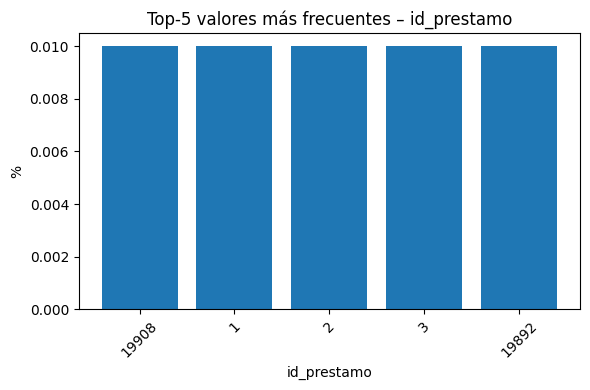

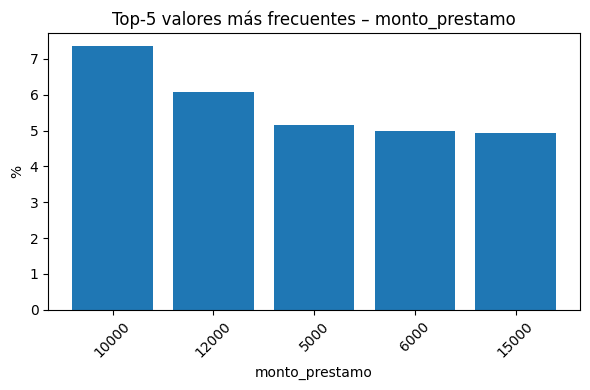

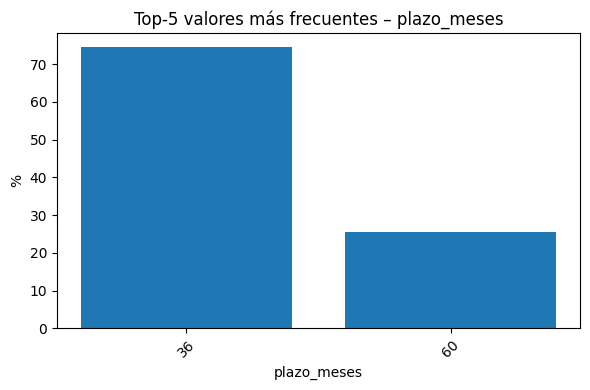

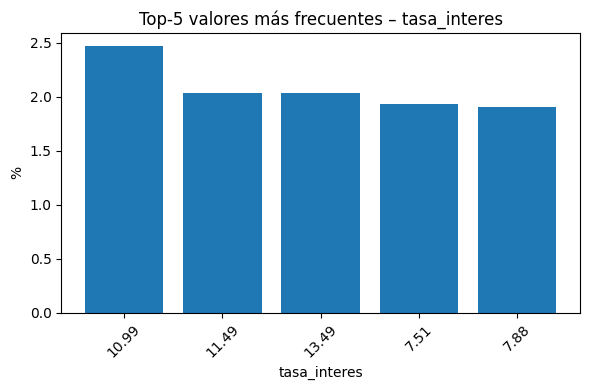

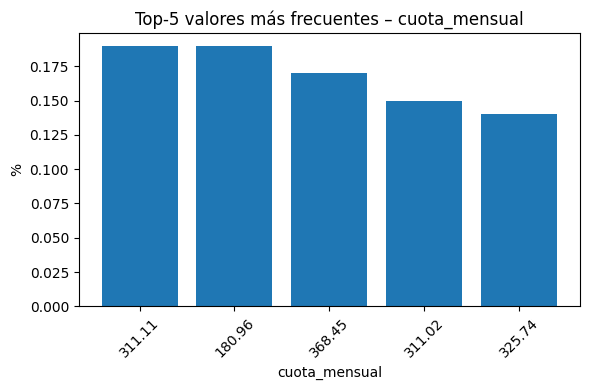

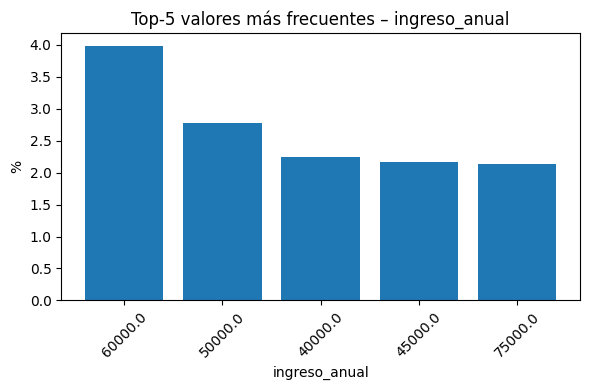

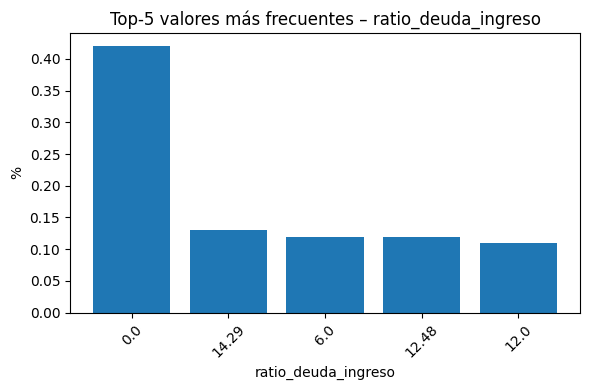

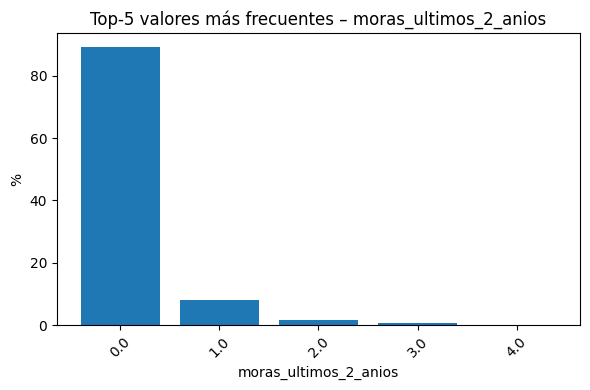

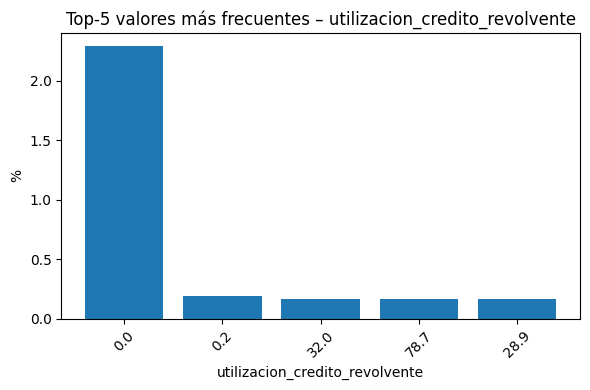

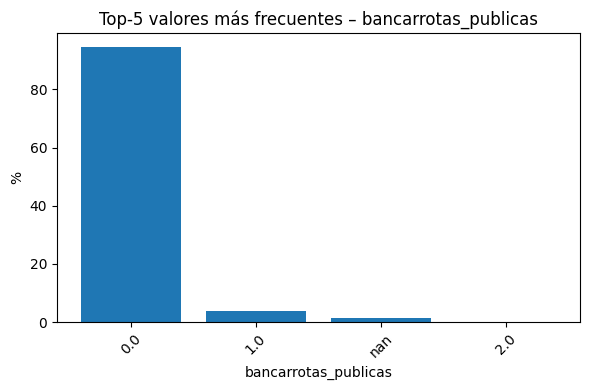

In [ ]:


desc_stats = Data_2[cols_num].describe().T
display(desc_stats)



quantiles = (
    Data_2[cols_num]
    .quantile([0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])
    .T
)
quantiles.columns = ["p1", "p5", "p10", "p25", "p50", "p75", "p90", "p95", "p99"]
display(quantiles)




missing_pct = (
    Data_2[cols_num]
    .isna()
    .mean()
    .mul(100)
    .to_frame("pct_missing")
)
display(missing_pct)


top5_tables = {}

for col in cols_num:
    vc = Data_2[col].value_counts(dropna=False).head(5)
    vp = Data_2[col].value_counts(normalize=True, dropna=False).head(5)

    top5 = pd.DataFrame({
        "valor": vc.index,
        "conteo": vc.values,
        "porcentaje": (vp.values * 100).round(2),
        "rank": range(1, len(vc) + 1)
    })

    top5_tables[col] = top5

    print(f"\nTop-5 valores más frecuentes: {col}\n")
    display(top5)



for col, top5 in top5_tables.items():
    plt.figure(figsize=(6, 4))
    plt.bar(top5["valor"].astype(str), top5["porcentaje"])
    plt.title(f"Top-5 valores más frecuentes – {col}")
    plt.ylabel("%")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

##1.2 Análisis Descriptivo de Variables Categóricas


Cardinalidad – calificacion_crediticia
n_unique = 7



,categoria,conteo,porcentaje
0,B,6065,30.47
1,A,4875,24.49
2,C,4087,20.53
3,D,2748,13.80
4,E,1434,7.20
5,F,540,2.71
6,G,159,0.80



Cardinalidad – ocupacion
n_unique = 15048



,categoria,conteo,porcentaje
0,nan,1185,5.95
1,Bank of America,53,0.27
2,Kaiser Permanente,50,0.25
3,State of California,42,0.21
4,US Army,40,0.20
...,...,...,...
15043,zashko inc.,1,0.01
15044,zakheim and lavrar,1,0.01
15045,zachry industral inc,1,0.01
15046,windsor staffing,1,0.01



Cardinalidad – antiguedad_laboral
n_unique = 12



,categoria,conteo,porcentaje
0,10+ years,4249,21.34
1,< 1 year,2304,11.57
2,2 years,2218,11.14
3,3 years,2108,10.59
4,4 years,1871,9.40
5,5 years,1649,8.28
6,1 year,1636,8.22
7,6 years,1151,5.78
8,7 years,867,4.36
9,8 years,718,3.61



Cardinalidad – tenencia_vivienda
n_unique = 6



,categoria,conteo,porcentaje
0,RENT,10965,55.08
1,MORTGAGE,7349,36.91
2,OWN,1546,7.77
3,OTHER,44,0.22
4,nan,3,0.02
5,NONE,1,0.01



Cardinalidad – verificacion_ingreso
n_unique = 4



,categoria,conteo,porcentaje
0,Not Verified,8256,41.47
1,Verified,6464,32.47
2,Source Verified,5185,26.04
3,nan,3,0.02



Cardinalidad – estado_prestamo
n_unique = 3



,categoria,conteo,porcentaje
0,Fully Paid,16962,85.20
1,Charged Off,2943,14.78
2,nan,3,0.02



Cardinalidad – plan_pagos
n_unique = 1



,categoria,conteo,porcentaje
0,s,19908,100.0



Cardinalidad – proposito_prestamo
n_unique = 15



,categoria,conteo,porcentaje
0,debt_consolidation,9387,47.15
1,credit_card,2696,13.54
2,other,2059,10.34
3,home_improvement,1330,6.68
4,major_purchase,1048,5.26
5,small_business,905,4.55
6,car,687,3.45
7,wedding,539,2.71
8,medical,350,1.76
9,moving,317,1.59



Cardinalidad – estado_residencia
n_unique = 9



,categoria,conteo,porcentaje
0,CA,7101,35.67
1,NY,3813,19.15
2,FL,2870,14.42
3,TX,2733,13.73
4,NJ,1855,9.32
5,IL,1525,7.66
6,nan,9,0.05
7,106xx,1,0.01
8,951xx,1,0.01



Cardinalidad – tipo_solicitud
n_unique = 2



,categoria,conteo,porcentaje
0,Individual,19906,99.99
1,1,2,0.01



Top-10 valores más frecuentes – calificacion_crediticia



,categoria,conteo,porcentaje,rank
0,B,6065,30.47,1
1,A,4875,24.49,2
2,C,4087,20.53,3
3,D,2748,13.80,4
4,E,1434,7.20,5
5,F,540,2.71,6
6,G,159,0.80,7



Top-10 valores más frecuentes – ocupacion



,categoria,conteo,porcentaje,rank
0,nan,1185,5.95,1
1,Bank of America,53,0.27,2
2,Kaiser Permanente,50,0.25,3
3,State of California,42,0.21,4
4,US Army,40,0.20,5
5,AT&T,36,0.18,6
6,JP Morgan Chase,27,0.14,7
7,IBM,25,0.13,8
8,Verizon,24,0.12,9
9,UPS,23,0.12,10



Top-10 valores más frecuentes – antiguedad_laboral



,categoria,conteo,porcentaje,rank
0,10+ years,4249,21.34,1
1,< 1 year,2304,11.57,2
2,2 years,2218,11.14,3
3,3 years,2108,10.59,4
4,4 years,1871,9.40,5
5,5 years,1649,8.28,6
6,1 year,1636,8.22,7
7,6 years,1151,5.78,8
8,7 years,867,4.36,9
9,8 years,718,3.61,10



Top-10 valores más frecuentes – tenencia_vivienda



,categoria,conteo,porcentaje,rank
0,RENT,10965,55.08,1
1,MORTGAGE,7349,36.91,2
2,OWN,1546,7.77,3
3,OTHER,44,0.22,4
4,nan,3,0.02,5
5,NONE,1,0.01,6



Top-10 valores más frecuentes – verificacion_ingreso



,categoria,conteo,porcentaje,rank
0,Not Verified,8256,41.47,1
1,Verified,6464,32.47,2
2,Source Verified,5185,26.04,3
3,nan,3,0.02,4



Top-10 valores más frecuentes – estado_prestamo



,categoria,conteo,porcentaje,rank
0,Fully Paid,16962,85.20,1
1,Charged Off,2943,14.78,2
2,nan,3,0.02,3



Top-10 valores más frecuentes – plan_pagos



,categoria,conteo,porcentaje,rank
0,s,19908,100.0,1



Top-10 valores más frecuentes – proposito_prestamo



,categoria,conteo,porcentaje,rank
0,debt_consolidation,9387,47.15,1
1,credit_card,2696,13.54,2
2,other,2059,10.34,3
3,home_improvement,1330,6.68,4
4,major_purchase,1048,5.26,5
5,small_business,905,4.55,6
6,car,687,3.45,7
7,wedding,539,2.71,8
8,medical,350,1.76,9
9,moving,317,1.59,10



Top-10 valores más frecuentes – estado_residencia



,categoria,conteo,porcentaje,rank
0,CA,7101,35.67,1
1,NY,3813,19.15,2
2,FL,2870,14.42,3
3,TX,2733,13.73,4
4,NJ,1855,9.32,5
5,IL,1525,7.66,6
6,nan,9,0.05,7
7,106xx,1,0.01,8
8,951xx,1,0.01,9



Top-10 valores más frecuentes – tipo_solicitud



,categoria,conteo,porcentaje,rank
0,Individual,19906,99.99,1
1,1,2,0.01,2


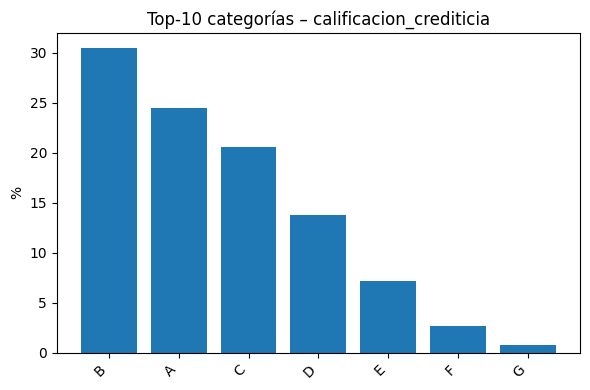

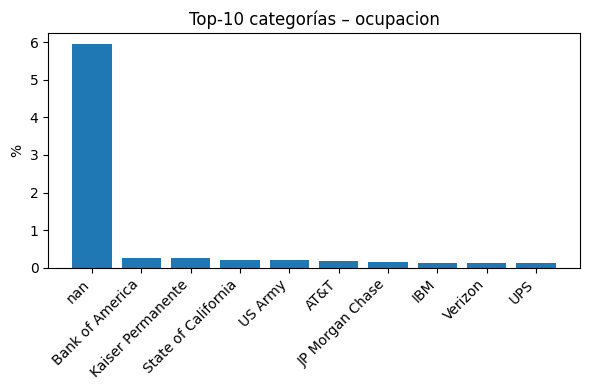

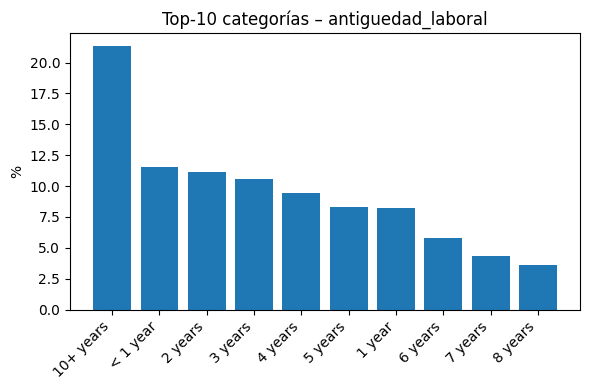

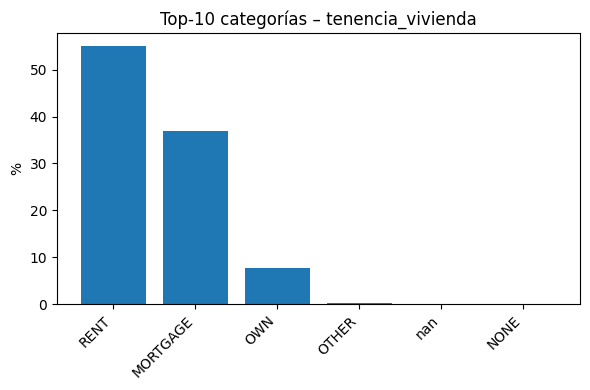

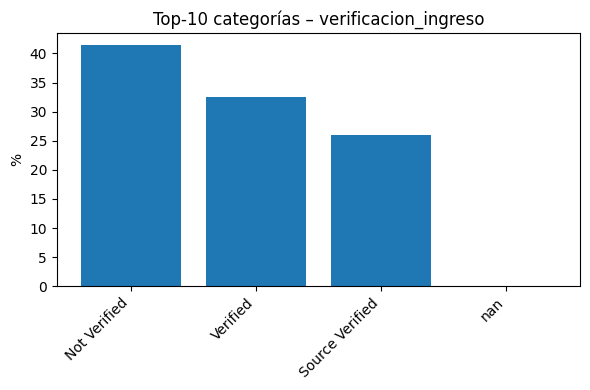

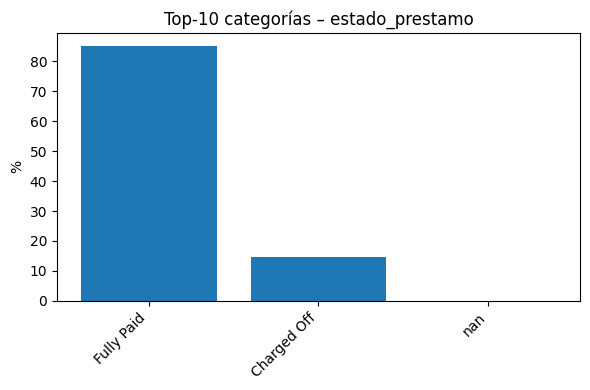

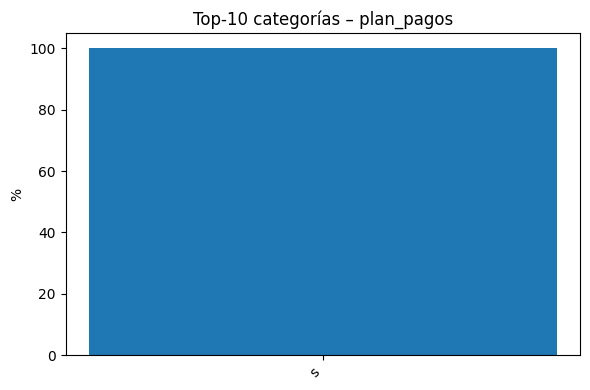

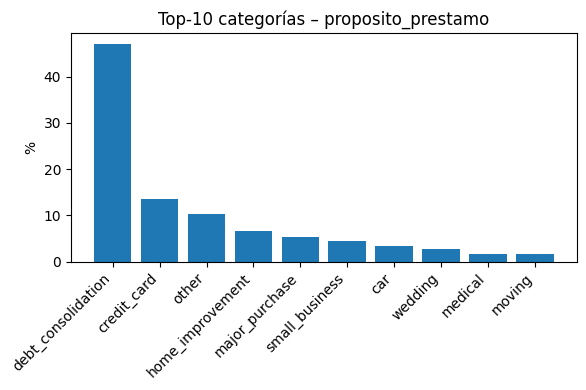

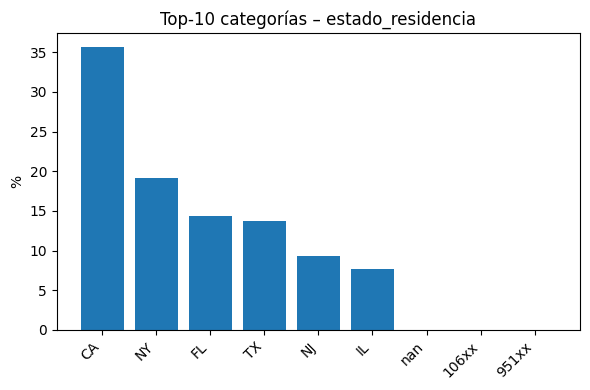

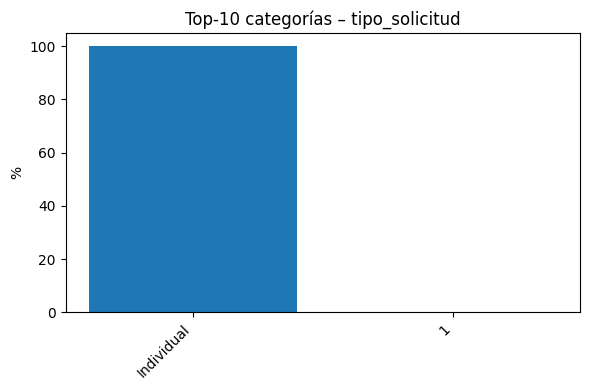

In [ ]:
n_total = len(Data_2)


cardinality_tables = {}

for col in cols_cat:
    vc = Data_2[col].value_counts(dropna=False)
    pct = (vc / n_total * 100).round(2)

    card = pd.DataFrame({
        "categoria": vc.index.astype(str),
        "conteo": vc.values,
        "porcentaje": pct.values
    })

    cardinality_tables[col] = {
        "n_unique": Data_2[col].nunique(dropna=False),
        "tabla": card
    }

    print(f"\nCardinalidad – {col}")
    print(f"n_unique = {Data_2[col].nunique(dropna=False)}\n")
    display(card)


top10_cat_tables = {}

for col in cols_cat:
    vc = Data_2[col].value_counts(dropna=False).head(10)
    vp = Data_2[col].value_counts(normalize=True, dropna=False).head(10)

    top10 = pd.DataFrame({
        "categoria": vc.index.astype(str),
        "conteo": vc.values,
        "porcentaje": (vp.values * 100).round(2),
        "rank": range(1, len(vc) + 1)
    })

    top10_cat_tables[col] = top10

    print(f"\nTop-10 valores más frecuentes – {col}\n")
    display(top10)



for col, df in top10_cat_tables.items():
    plt.figure(figsize=(6, 4))
    plt.bar(df["categoria"], df["porcentaje"])
    plt.title(f"Top-10 categorías – {col}")
    plt.ylabel("%")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


#2. Análisis de Calidad de los Datos (Diagnóstico)


##2.1 Calidad de Variables Numéricas

In [ ]:

audit_dtypes = pd.DataFrame({
    "dtype_original": Data_2[cols_num].dtypes
})

Data_2[cols_num] = Data_2[cols_num].apply(pd.to_numeric, errors="coerce")

audit_dtypes["dtype_post_coerce"] = Data_2[cols_num].dtypes
display(audit_dtypes)


missing_audit = (
    pd.DataFrame({
        "n_missing": Data_2[cols_num].isna().sum(),
        "pct_missing": Data_2[cols_num].isna().mean().mul(100).round(2)
    })
    .sort_values("pct_missing", ascending=False)
)

display(missing_audit)



quantiles = (
    Data_2[cols_num]
    .quantile([0.01, 0.50, 0.99])
    .T
)
quantiles.columns = ["p1", "p50", "p99"]

extremos = (
    Data_2[cols_num]
    .agg(["min", "max"])
    .T
)

outlier_audit = quantiles.join(extremos)
display(outlier_audit)

outlier_iqr = {}

for col in cols_num:
    q1 = Data_2[col].quantile(0.25)
    q3 = Data_2[col].quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    mask = (Data_2[col] < lower) | (Data_2[col] > upper)

    outlier_iqr[col] = {
        "q1": q1,
        "q3": q3,
        "iqr": iqr,
        "lower_bound": lower,
        "upper_bound": upper,
        "n_outliers": mask.sum(),
        "pct_outliers": round(mask.mean() * 100, 2)
    }

outlier_iqr_summary = pd.DataFrame(outlier_iqr).T
display(outlier_iqr_summary)

n_dup = Data_2.duplicated().sum()
pct_dup = round(n_dup / len(Data_2) * 100, 2)

display(
    pd.DataFrame({
        "n_duplicados": [n_dup],
        "pct_duplicados": [pct_dup]
    })
)

,dtype_original,dtype_post_coerce
id_prestamo,int64,int64
monto_prestamo,int64,int64
plazo_meses,int64,int64
tasa_interes,float64,float64
cuota_mensual,float64,float64
ingreso_anual,float64,float64
ratio_deuda_ingreso,float64,float64
moras_ultimos_2_anios,float64,float64
utilizacion_credito_revolvente,float64,float64
bancarrotas_publicas,float64,float64


,n_missing,pct_missing
bancarrotas_publicas,321,1.61
utilizacion_credito_revolvente,28,0.14
ratio_deuda_ingreso,11,0.06
moras_ultimos_2_anios,9,0.05
ingreso_anual,3,0.02
id_prestamo,0,0.00
monto_prestamo,0,0.00
cuota_mensual,0,0.00
plazo_meses,0,0.00
tasa_interes,0,0.00


,p1,p50,p99,min,max
id_prestamo,200.0700,9954.50,19708.9300,1.00,19908.00
monto_prestamo,1200.0000,10000.00,35000.0000,500.00,35000.00
plazo_meses,36.0000,36.00,60.0000,36.00,60.00
tasa_interes,5.4200,11.86,20.9900,5.42,24.40
cuota_mensual,39.1449,285.78,933.1337,15.69,1302.69
ingreso_anual,14400.0000,60000.00,248003.8400,4000.00,6000000.00
ratio_deuda_ingreso,0.3500,13.08,26.2600,0.00,29.99
moras_ultimos_2_anios,0.0000,0.00,2.0000,0.00,11.00
utilizacion_credito_revolvente,0.0000,50.30,98.5000,0.00,5829.00
bancarrotas_publicas,0.0000,0.00,1.0000,0.00,2.00


,q1,q3,iqr,lower_bound,upper_bound,n_outliers,pct_outliers
id_prestamo,4977.7500,14931.250,9953.5000,-9952.50000,29861.50000,0.0,0.00
monto_prestamo,5750.0000,15000.000,9250.0000,-8125.00000,28875.00000,656.0,3.30
plazo_meses,36.0000,60.000,24.0000,0.00000,96.00000,0.0,0.00
tasa_interes,9.4500,14.610,5.1600,1.71000,22.35000,45.0,0.23
cuota_mensual,171.2875,440.815,269.5275,-233.00375,845.10625,542.0,2.72
ingreso_anual,42000.0000,85000.000,43000.0000,-22500.00000,149500.00000,1062.0,5.33
ratio_deuda_ingreso,7.8400,18.200,10.3600,-7.70000,33.74000,0.0,0.00
moras_ultimos_2_anios,0.0000,0.000,0.0000,0.00000,0.00000,2119.0,10.64
utilizacion_credito_revolvente,26.5000,72.800,46.3000,-42.95000,142.25000,2.0,0.01
bancarrotas_publicas,0.0000,0.000,0.0000,0.00000,0.00000,743.0,3.73


,n_duplicados,pct_duplicados
0,0,0.0


In [ ]:

for c in cols_num:
    med = Data_2[c].median()
    Data_2[c].fillna(med, inplace=True)


winsor_map = {

    "id_prestamo": None,
    "plazo_meses": None,
    "moras_ultimos_2_anios": None,
    "bancarrotas_publicas": None,


    "monto_prestamo": (0.01, 0.99),
    "tasa_interes": (0.01, 0.99),
    "cuota_mensual": (0.01, 0.99),
    "ingreso_anual": (0.01, 0.99),
    "ratio_deuda_ingreso": (0.01, 0.99),
    "utilizacion_credito_revolvente": (0.01, 0.99),
}

for c, bounds in winsor_map.items():
    if bounds is None:
        continue

    p_low, p_high = Data_2[c].quantile(list(bounds))
    Data_2[c] = Data_2[c].clip(lower=p_low, upper=p_high)


print("\nPOST-LIMPIEZA – DESCRIPTIVA (p1 / p50 / p99)\n")
display(
    Data_2[cols_num]
    .quantile([0.01, 0.50, 0.99])
    .T
)

print("\nPOST-LIMPIEZA – MISSING\n")
display(
    Data_2[cols_num]
    .isna()
    .mean()
    .mul(100)
    .round(2)
    .to_frame("pct_missing")
)


POST-LIMPIEZA – DESCRIPTIVA (p1 / p50 / p99)



/tmp/ipython-input-2864553671.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Data_2[c].fillna(med, inplace=True)


,0.01,0.50,0.99
id_prestamo,200.070000,9954.50,19708.930000
monto_prestamo,1200.000000,10000.00,35000.000000
plazo_meses,36.000000,36.00,60.000000
tasa_interes,5.420000,11.86,20.990000
cuota_mensual,39.149457,285.78,933.127841
ingreso_anual,14400.000000,60000.00,248003.459600
ratio_deuda_ingreso,0.351351,13.08,26.260000
moras_ultimos_2_anios,0.000000,0.00,2.000000
utilizacion_credito_revolvente,0.000000,50.30,98.500000
bancarrotas_publicas,0.000000,0.00,1.000000



POST-LIMPIEZA – MISSING



,pct_missing
id_prestamo,0.0
monto_prestamo,0.0
plazo_meses,0.0
tasa_interes,0.0
cuota_mensual,0.0
ingreso_anual,0.0
ratio_deuda_ingreso,0.0
moras_ultimos_2_anios,0.0
utilizacion_credito_revolvente,0.0
bancarrotas_publicas,0.0


##2.2 Calidad de Variables Categóricas

In [ ]:
cols_cat = [
    "calificacion_crediticia",
    "ocupacion",
    "antiguedad_laboral",
    "tenencia_vivienda",
    "verificacion_ingreso",
    "estado_prestamo",
    "plan_pagos",
    "proposito_prestamo",
    "estado_residencia",
    "tipo_solicitud"
]

MISSING_CODED = ["", "?", "nan", "NaN", "None", "N/A", "NA", "null", "NULL"]

def visualizar_cat(col, min_pct_rare=0.005, top=20):

    n_missing = int(Data_2[col].isna().sum())
    pct_missing = float(Data_2[col].isna().mean() * 100)
    tabla_missing = pd.DataFrame({"n_missing":[n_missing], "pct_missing":[round(pct_missing, 6)]})


    s = Data_2[col].astype("string").str.strip()
    tabla_missing_coded = (
        s.isin(MISSING_CODED)
        .value_counts(dropna=False)
        .rename_axis("es_missing_codificado")
        .reset_index(name="conteo")
    )


    vc_no_na = Data_2[col].value_counts(normalize=True, dropna=True)
    low_freq = vc_no_na[vc_no_na < min_pct_rare].sort_values(ascending=False)
    tabla_baja_freq = (
        (low_freq * 100)
        .rename("porcentaje")
        .reset_index()
        .rename(columns={"index":"categoria"})
    )


    vc = Data_2[col].value_counts(dropna=False)
    vc_pct = Data_2[col].value_counts(normalize=True, dropna=False) * 100
    tabla_unicos = pd.DataFrame({
        "categoria": vc.index.astype("string"),
        "conteo": vc.values,
        "porcentaje": vc_pct.values
    }).head(top)

    print("\n" + "="*70)
    print(f"COLUMNA: {col}")
    print("="*70)

    print("\n[1] Missing (NaN) -> isna() + mean()")
    print(tabla_missing)

    print("\n[2] Missing codificado -> str.strip() + comparación == + conteo")
    print(tabla_missing_coded)

    print(f"\n[3] Categorías con baja frecuencia (< {min_pct_rare*100:.2f}%) -> value_counts()")
    if tabla_baja_freq.empty:
        print("No hay categorías bajo el umbral.")
    else:
        print(tabla_baja_freq.head(50))

    print("\n[4] Valores únicos / inesperados (incluye NA) -> value_counts(dropna=False)")
    print(tabla_unicos)

for c in cols_cat:
    visualizar_cat(c, min_pct_rare=0.005, top=25)


COLUMNA: calificacion_crediticia

[1] Missing (NaN) -> isna() + mean()
   n_missing  pct_missing
0          0          0.0

[2] Missing codificado -> str.strip() + comparación == + conteo
   es_missing_codificado  conteo
0                  False   19908

[3] Categorías con baja frecuencia (< 0.50%) -> value_counts()
No hay categorías bajo el umbral.

[4] Valores únicos / inesperados (incluye NA) -> value_counts(dropna=False)
  categoria  conteo  porcentaje
0         B    6065   30.465140
1         A    4875   24.487643
2         C    4087   20.529435
3         D    2748   13.803496
4         E    1434    7.203134
5         F     540    2.712477
6         G     159    0.798674

COLUMNA: ocupacion

[1] Missing (NaN) -> isna() + mean()
   n_missing  pct_missing
0       1185     5.952381

[2] Missing codificado -> str.strip() + comparación == + conteo
   es_missing_codificado  conteo
0                  False   19908

[3] Categorías con baja frecuencia (< 0.50%) -> value_counts()
         

#3. Preprocesamiento de Datos

##3.1 Variables Numéricas


In [ ]:

missing_before = (
    Data_2[cols_num]
    .isna()
    .mean()
    .mul(100)
    .round(2)
    .to_frame("pct_missing_before")
)

print("\n=== Missing antes de imputación ===")
display(missing_before)


imputer = SimpleImputer(strategy="median")
Data_2[cols_num] = imputer.fit_transform(Data_2[cols_num])



missing_after = (
    Data_2[cols_num]
    .isna()
    .mean()
    .mul(100)
    .round(2)
    .to_frame("pct_missing_after")
)

print("\n=== Missing después de imputación ===")
display(missing_after)



impact_imputation = pd.DataFrame({
    "mean": Data_2[cols_num].mean(),
    "median": Data_2[cols_num].median()
}).round(2)

print("\n=== Impacto de imputación (mean vs median) ===")
display(impact_imputation)


if "ingreso_anual" in cols_num and (Data_2["ingreso_anual"] > 0).all():
    Data_2["ingreso_anual_log"] = np.log1p(Data_2["ingreso_anual"])
    cols_num.append("ingreso_anual_log")

print("\n=== Variables transformadas con log ===")
print(["ingreso_anual"])



skew_check = pd.DataFrame({
    "skew_original": [Data_2["ingreso_anual"].skew()],
    "skew_log": [Data_2["ingreso_anual_log"].skew()]
}, index=["ingreso_anual"]).round(3)

print("\n=== Reducción de sesgo tras log ===")
display(skew_check)



print("\n=== Tipos finales de variables numéricas ===")
display(Data_2[cols_num].dtypes)



=== Missing antes de imputación ===


,pct_missing_before
id_prestamo,0.0
monto_prestamo,0.0
plazo_meses,0.0
tasa_interes,0.0
cuota_mensual,0.0
ingreso_anual,0.0
ratio_deuda_ingreso,0.0
moras_ultimos_2_anios,0.0
utilizacion_credito_revolvente,0.0
bancarrotas_publicas,0.0



=== Missing después de imputación ===


,pct_missing_after
id_prestamo,0.0
monto_prestamo,0.0
plazo_meses,0.0
tasa_interes,0.0
cuota_mensual,0.0
ingreso_anual,0.0
ratio_deuda_ingreso,0.0
moras_ultimos_2_anios,0.0
utilizacion_credito_revolvente,0.0
bancarrotas_publicas,0.0



=== Impacto de imputación (mean vs median) ===


,mean,median
id_prestamo,9954.50,9954.50
monto_prestamo,11355.42,10000.00
plazo_meses,42.10,36.00
tasa_interes,12.08,11.86
cuota_mensual,329.21,285.78
ingreso_anual,69316.28,60000.00
ratio_deuda_ingreso,13.00,13.08
moras_ultimos_2_anios,0.14,0.00
utilizacion_credito_revolvente,49.43,50.30
bancarrotas_publicas,0.04,0.00



=== Variables transformadas con log ===
['ingreso_anual']

=== Reducción de sesgo tras log ===


,skew_original,skew_log
ingreso_anual,1.772,0.012



=== Tipos finales de variables numéricas ===


,0
id_prestamo,float64
monto_prestamo,float64
plazo_meses,float64
tasa_interes,float64
cuota_mensual,float64
ingreso_anual,float64
ratio_deuda_ingreso,float64
moras_ultimos_2_anios,float64
utilizacion_credito_revolvente,float64
bancarrotas_publicas,float64


##3.2 Variables Categóricas


In [ ]:


UNKNOWN = "UNKNOWN"
OTHER   = "OTHER"

cols_cat = [
    "calificacion_crediticia",
    "ocupacion",
    "antiguedad_laboral",
    "tenencia_vivienda",
    "verificacion_ingreso",
    "estado_prestamo",
    "plan_pagos",
    "proposito_prestamo",
    "estado_residencia",
    "tipo_solicitud"
]

MISSING_CODED = ["", "?", "nan", "NaN", "None", "N/A", "NA", "null", "NULL"]


def reporte_cat(col, min_pct_rare=0.005, top=15):
    n_missing = int(Data_2[col].isna().sum())
    pct_missing = float(Data_2[col].isna().mean() * 100)

    s = Data_2[col].astype("string").str.strip()
    n_missing_coded = int(s.isin(MISSING_CODED).sum())

    vc = Data_2[col].value_counts(dropna=False)
    vc_pct = Data_2[col].value_counts(normalize=True, dropna=False) * 100

    vc_pct_no_na = Data_2[col].value_counts(normalize=True, dropna=True)
    low_freq = vc_pct_no_na[vc_pct_no_na < min_pct_rare]

    print("\n==============================")
    print(f"COLUMNA: {col}")
    print("==============================")
    print(f"Missing (NaN real): {n_missing} ({pct_missing:.2f}%)")
    print(f"Missing codificado: {n_missing_coded}")

    print("\nTop (incluye NaN):")
    print(pd.DataFrame({"conteo": vc.head(top), "porcentaje": vc_pct.head(top).round(6)}))

    print(f"\nBaja frecuencia (< {min_pct_rare*100:.2f}%): {len(low_freq)}")
    if len(low_freq) > 0:
        print(pd.DataFrame({"porcentaje": (low_freq*100).round(6)}).head(25))



def bucket_rare_inplace(col, min_pct=0.005, top_k=20):

    Data_2[col] = Data_2[col].fillna(UNKNOWN)


    Data_2[col] = Data_2[col].where(
        ~Data_2[col].astype("string").str.fullmatch(r"(?i)other", na=False),
        other=OTHER
    )


    mask_core = (Data_2[col] != UNKNOWN) & (Data_2[col] != OTHER)
    vc = Data_2.loc[mask_core, col].value_counts(dropna=True)
    if len(vc) == 0:
        Data_2[col] = Data_2[col].astype("category")
        return

    top_keep = vc.head(top_k).index
    vc_pct = vc / vc.sum()
    pct_keep = vc_pct[vc_pct >= min_pct].index
    keep = pd.Index(top_keep).union(pd.Index(pct_keep))


    Data_2[col] = Data_2[col].where(
        (Data_2[col] == UNKNOWN) | (Data_2[col] == OTHER) | (Data_2[col].isin(keep)),
        other=OTHER
    ).astype("category")



for col in cols_cat:
    Data_2[col] = Data_2[col].astype("string").str.strip()
    Data_2[col] = Data_2[col].replace({k: pd.NA for k in MISSING_CODED})



Data_2["calificacion_crediticia"] = (
    Data_2["calificacion_crediticia"]
    .astype("category")
    .cat.set_categories(["G","F","E","D","C","B","A"], ordered=True)
)


bucket_rare_inplace("ocupacion", min_pct=0.003, top_k=200)


Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].fillna(UNKNOWN)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].str.lower().str.replace(r"\s+", " ", regex=True)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].str.replace("years", "year", regex=False)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].str.replace(r"^<\s*1\s*year$", "0-1 year", regex=True)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].str.replace(r"^10\+\s*year$", "10+ year", regex=True)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].str.replace(r"^(\d+)\s*year$", r"\1 year", regex=True)
Data_2["antiguedad_laboral"] = Data_2["antiguedad_laboral"].replace({"unknown": UNKNOWN})
Data_2["antiguedad_laboral"] = (
    Data_2["antiguedad_laboral"]
    .astype("category")
    .cat.set_categories(
        ["0-1 year","1 year","2 year","3 year","4 year","5 year","6 year","7 year","8 year","9 year","10+ year", UNKNOWN],
        ordered=True
    )
)

Data_2["tenencia_vivienda"] = Data_2["tenencia_vivienda"].str.upper()
Data_2["tenencia_vivienda"] = Data_2["tenencia_vivienda"].replace({"NONE": pd.NA})
Data_2["tenencia_vivienda"] = Data_2["tenencia_vivienda"].fillna(UNKNOWN).astype("category")


Data_2["verificacion_ingreso"] = Data_2["verificacion_ingreso"].fillna(UNKNOWN).astype("category")

Data_2["estado_prestamo"] = Data_2["estado_prestamo"].fillna(UNKNOWN).astype("category")


Data_2["plan_pagos"] = Data_2["plan_pagos"].astype("category")

Data_2["proposito_prestamo"] = Data_2["proposito_prestamo"].fillna(UNKNOWN)
Data_2["proposito_prestamo"] = Data_2["proposito_prestamo"].where(
    ~Data_2["proposito_prestamo"].astype("string").str.fullmatch(r"(?i)other", na=False),
    other=OTHER
).astype("category")


Data_2["estado_residencia"] = Data_2["estado_residencia"].str.upper()
mask_state = Data_2["estado_residencia"].str.fullmatch(r"[A-Z]{2}", na=True)
Data_2["estado_residencia"] = Data_2["estado_residencia"].where(mask_state, other=pd.NA)
Data_2["estado_residencia"] = Data_2["estado_residencia"].fillna(UNKNOWN).astype("category")


Data_2["tipo_solicitud"] = Data_2["tipo_solicitud"].replace({"1": "Individual"})
Data_2["tipo_solicitud"] = Data_2["tipo_solicitud"].fillna(UNKNOWN).astype("category")



for c in cols_cat:
    reporte_cat(c, min_pct_rare=0.005)



COLUMNA: calificacion_crediticia
Missing (NaN real): 0 (0.00%)
Missing codificado: 0

Top (incluye NaN):
                         conteo  porcentaje
calificacion_crediticia                    
B                          6065   30.465140
A                          4875   24.487643
C                          4087   20.529435
D                          2748   13.803496
E                          1434    7.203134
F                           540    2.712477
G                           159    0.798674

Baja frecuencia (< 0.50%): 0

COLUMNA: ocupacion
Missing (NaN real): 0 (0.00%)
Missing codificado: 0

Top (incluye NaN):
                     conteo  porcentaje
ocupacion                              
OTHER                 16698   83.875829
UNKNOWN                1185    5.952381
Bank of America          53    0.266225
Kaiser Permanente        50    0.251155
State of California      43    0.215994
US Army                  41    0.205947
AT&T                     36    0.180832
JP Morgan Chase 

#4. Análisis Exploratorio de Datos (EDA Univariado) y Visualización

## 4.1 Variables Numéricas: Estadística Descriptiva y Visualización


=== Estadísticos descriptivos ===


,id_prestamo,monto_prestamo,plazo_meses,tasa_interes,cuota_mensual,ingreso_anual,ratio_deuda_ingreso,moras_ultimos_2_anios,utilizacion_credito_revolvente,bancarrotas_publicas,ingreso_anual_log
count,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000,19908.000000
mean,9954.500000,11355.424955,42.095238,12.079573,329.211270,69316.282499,12.996381,0.144491,49.425485,0.037372,10.997667
std,5747.088915,7461.526200,10.446974,3.671600,205.410388,40830.039413,6.623622,0.493405,28.169542,0.189941,0.544575
min,1.000000,1200.000000,36.000000,5.420000,39.144900,14400.000000,0.350700,0.000000,0.000000,0.000000,9.575053
25%,4977.750000,5750.000000,36.000000,9.450000,171.287500,42000.000000,7.840000,0.000000,26.500000,0.000000,10.645449
50%,9954.500000,10000.000000,36.000000,11.860000,285.780000,60000.000000,13.080000,0.000000,50.300000,0.000000,11.002117
75%,14931.250000,15000.000000,60.000000,14.610000,440.815000,85000.000000,18.200000,0.000000,72.800000,0.000000,11.350418
max,19908.000000,35000.000000,60.000000,20.990000,933.133700,248003.720000,26.260000,11.000000,98.500000,2.000000,12.421203



=== Cuantiles (colas y outliers) ===


,0.01,0.05,0.10,0.25,0.50,0.75,0.90,0.95,0.99
id_prestamo,200.070000,996.350000,1991.700000,4977.750000,9954.500000,14931.250000,17917.300000,18912.650000,19708.930000
monto_prestamo,1200.000000,2400.000000,3500.000000,5750.000000,10000.000000,15000.000000,22400.000000,25000.000000,35000.000000
plazo_meses,36.000000,36.000000,36.000000,36.000000,36.000000,60.000000,60.000000,60.000000,60.000000
tasa_interes,5.420000,6.540000,7.140000,9.450000,11.860000,14.610000,16.890000,18.540000,20.990000
cuota_mensual,39.149457,75.480000,102.840000,171.287500,285.780000,440.815000,636.369000,773.400000,933.127841
ingreso_anual,14400.000000,24000.000000,30000.000000,42000.000000,60000.000000,85000.000000,120000.000000,150000.000000,248003.459600
ratio_deuda_ingreso,0.351351,1.983500,3.797000,7.840000,13.080000,18.200000,22.130000,23.690000,26.260000
moras_ultimos_2_anios,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.000000
utilizacion_credito_revolvente,0.000000,2.900000,9.000000,26.500000,50.300000,72.800000,88.000000,93.700000,98.500000
bancarrotas_publicas,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000



=== % Missing por variable ===


,0
id_prestamo,0.0
monto_prestamo,0.0
plazo_meses,0.0
tasa_interes,0.0
cuota_mensual,0.0
ingreso_anual,0.0
ratio_deuda_ingreso,0.0
moras_ultimos_2_anios,0.0
utilizacion_credito_revolvente,0.0
bancarrotas_publicas,0.0



=== Top-5 valores más frecuentes (numéricas) ===

id_prestamo


,proportion
id_prestamo,
19908.0,0.01
1.0,0.01
2.0,0.01
3.0,0.01
19892.0,0.01



monto_prestamo


,proportion
monto_prestamo,
10000.0,7.36
12000.0,6.07
5000.0,5.15
6000.0,4.99
15000.0,4.94



plazo_meses


,proportion
plazo_meses,
36.0,74.6
60.0,25.4



tasa_interes


,proportion
tasa_interes,
10.99,2.47
11.49,2.04
13.49,2.04
7.51,1.93
7.88,1.91



cuota_mensual


,proportion
cuota_mensual,
933.1337,1.00
39.1449,1.00
311.1100,0.19
180.9600,0.19
368.4500,0.17



ingreso_anual


,proportion
ingreso_anual,
60000.0,4.00
50000.0,2.78
40000.0,2.24
45000.0,2.16
75000.0,2.13



ratio_deuda_ingreso


,proportion
ratio_deuda_ingreso,
26.2600,1.01
0.3507,1.00
14.2900,0.13
13.0800,0.13
6.0000,0.12



moras_ultimos_2_anios


,proportion
moras_ultimos_2_anios,
0.0,89.36
1.0,8.12
2.0,1.71
3.0,0.56
4.0,0.15



utilizacion_credito_revolvente


,proportion
utilizacion_credito_revolvente,
0.0,2.29
98.5,1.04
50.3,0.24
0.2,0.19
78.7,0.17



bancarrotas_publicas


,proportion
bancarrotas_publicas,
0.0,96.27
1.0,3.73
2.0,0.01



ingreso_anual_log


,proportion
ingreso_anual_log,
11.002117,4.00
10.819798,2.78
10.596660,2.24
10.714440,2.16
11.225257,2.13


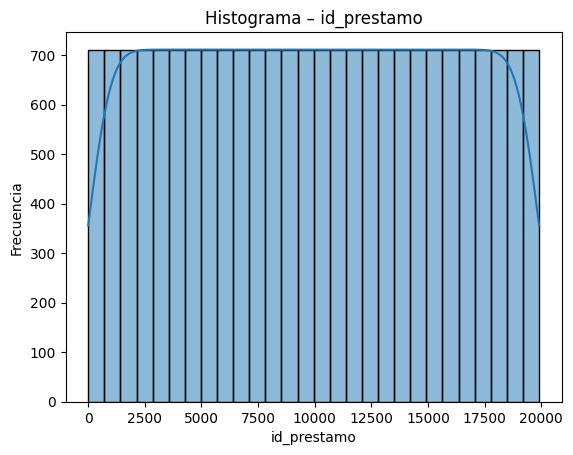

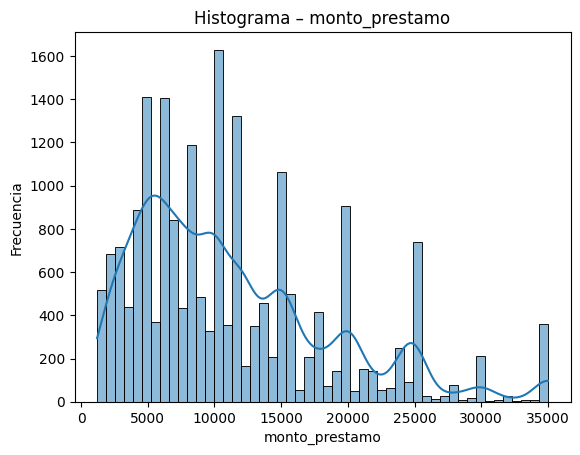

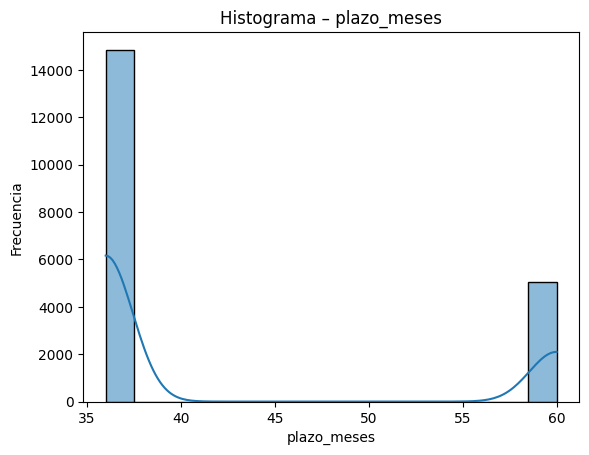

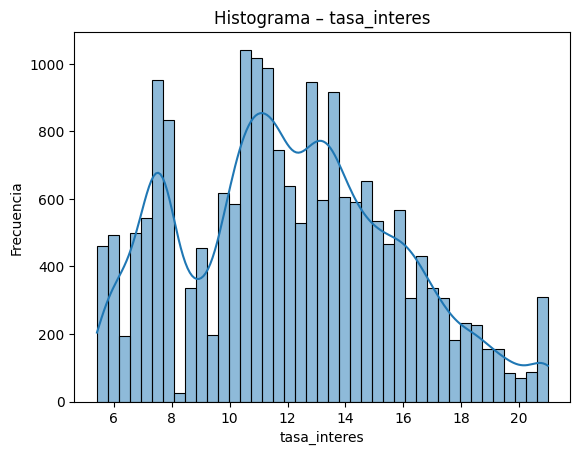

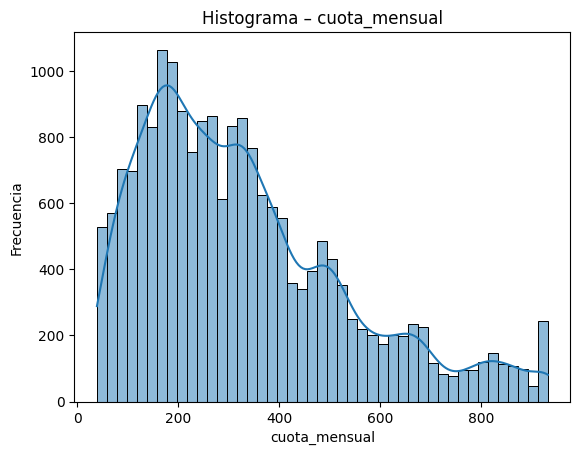

...

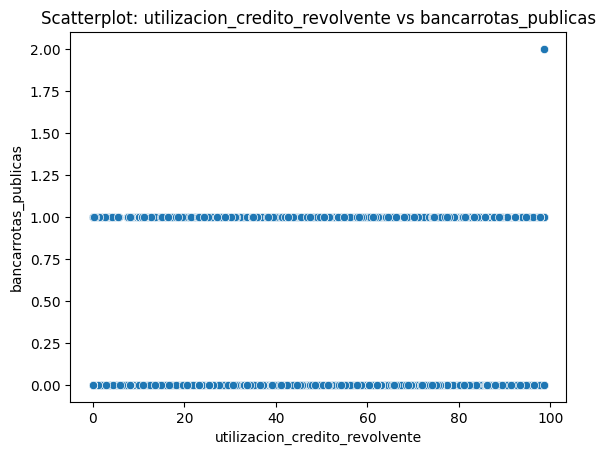

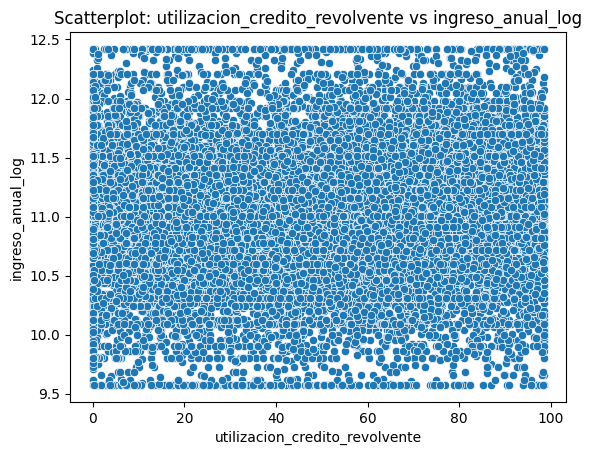

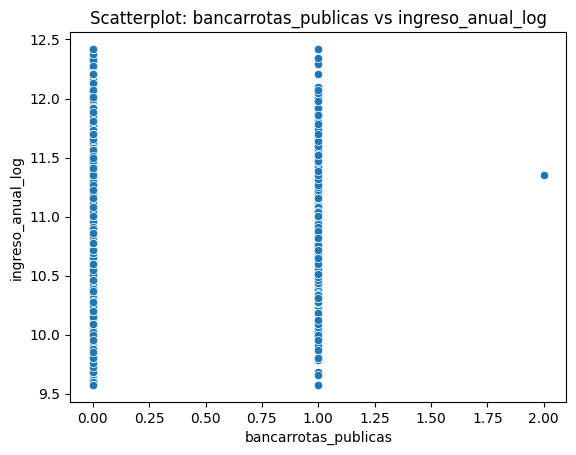

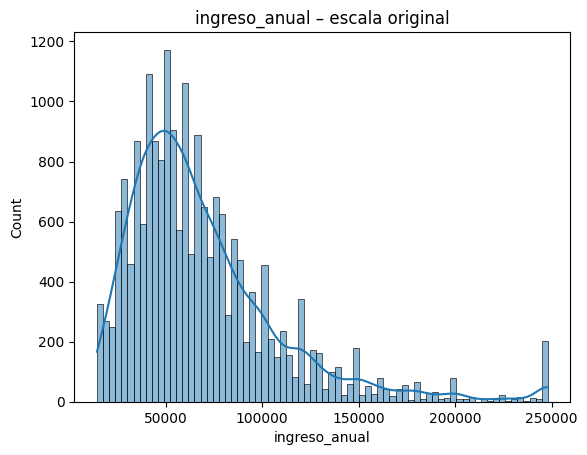

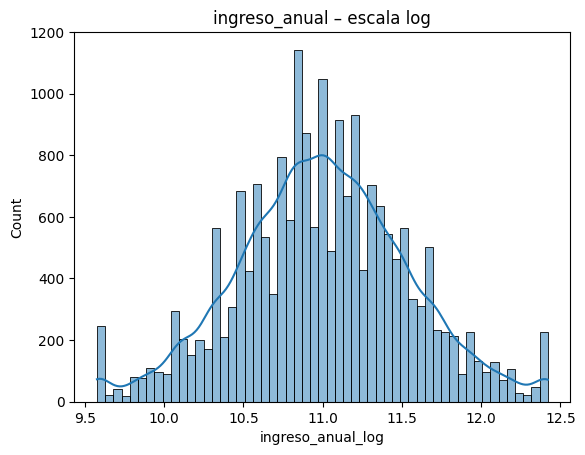

In [ ]:

print("\n=== Estadísticos descriptivos ===")
display(Data_2[cols_num].describe())



print("\n=== Cuantiles (colas y outliers) ===")
display(
    Data_2[cols_num]
    .quantile([0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])
    .T
)



print("\n=== % Missing por variable ===")
display(
    Data_2[cols_num]
    .isna()
    .mean()
    .mul(100)
    .round(2)
)



print("\n=== Top-5 valores más frecuentes (numéricas) ===")
for col in cols_num:
    print(f"\n{col}")
    display(
        Data_2[col]
        .value_counts(normalize=True)
        .head(5)
        .mul(100)
        .round(2)
    )



for col in cols_num:
    plt.figure()
    sns.histplot(Data_2[col], kde=True)
    plt.title(f"Histograma – {col}")
    plt.xlabel(col)
    plt.ylabel("Frecuencia")
    plt.show()



for col in cols_num:
    plt.figure()
    sns.boxplot(x=Data_2[col])
    plt.title(f"Boxplot – {col}")
    plt.xlabel(col)
    plt.show()



num_list = list(cols_num)

for i in range(len(num_list)):
    for j in range(i + 1, len(num_list)):
        x, y = num_list[i], num_list[j]
        plt.figure()
        sns.scatterplot(x=Data_2[x], y=Data_2[y])
        plt.title(f"Scatterplot: {x} vs {y}")
        plt.xlabel(x)
        plt.ylabel(y)
        plt.show()



for col in cols_num:
    log_col = f"{col}_log"
    if log_col in Data_2.columns:
        plt.figure()
        sns.histplot(Data_2[col], kde=True)
        plt.title(f"{col} – escala original")
        plt.show()

        plt.figure()
        sns.histplot(Data_2[log_col], kde=True)
        plt.title(f"{col} – escala log")
        plt.show()

##4.2 Variables Categóricas: Frecuencias y Visualización

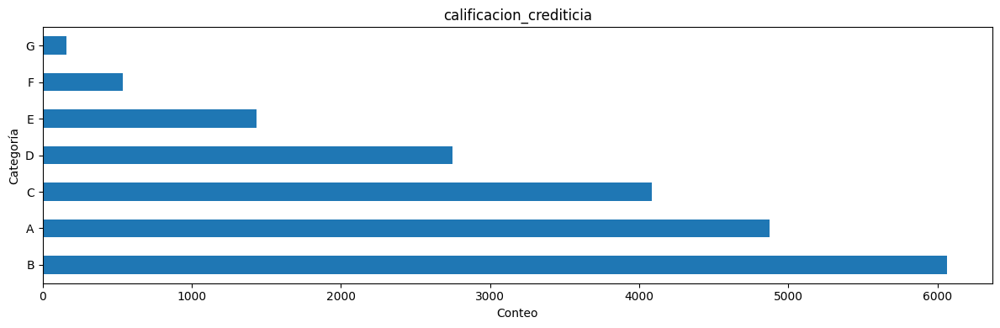

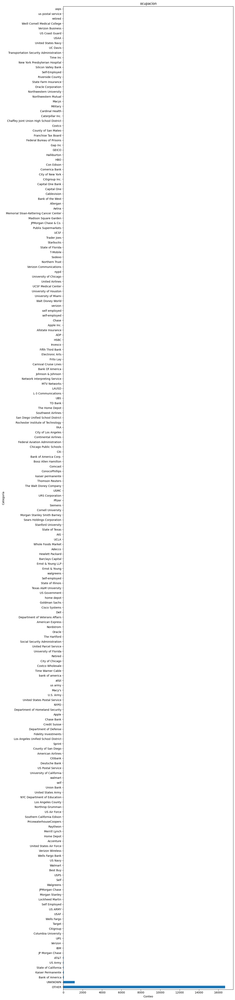

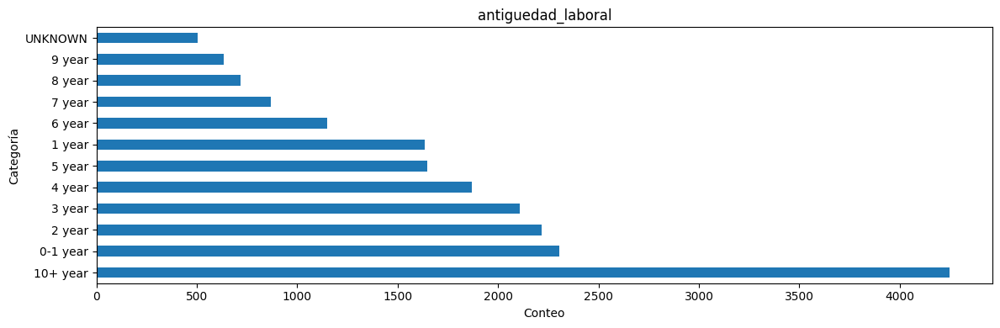

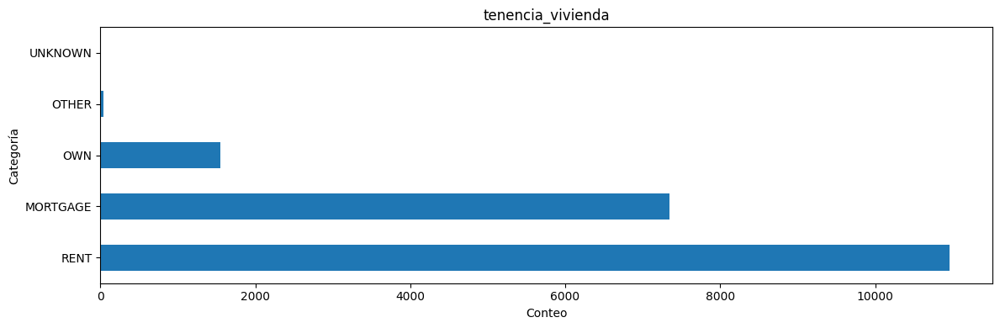

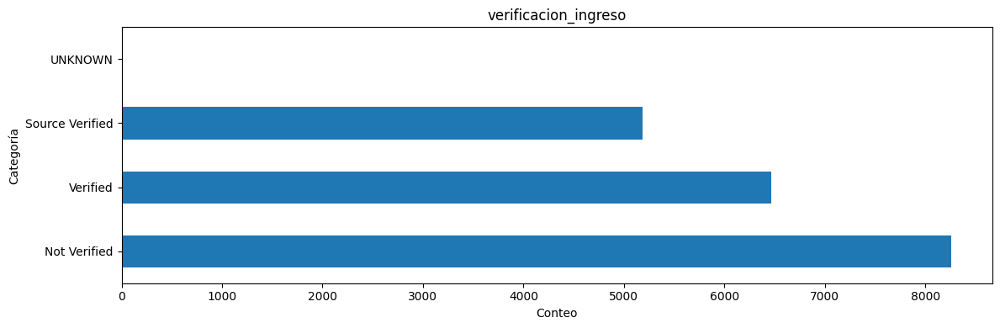

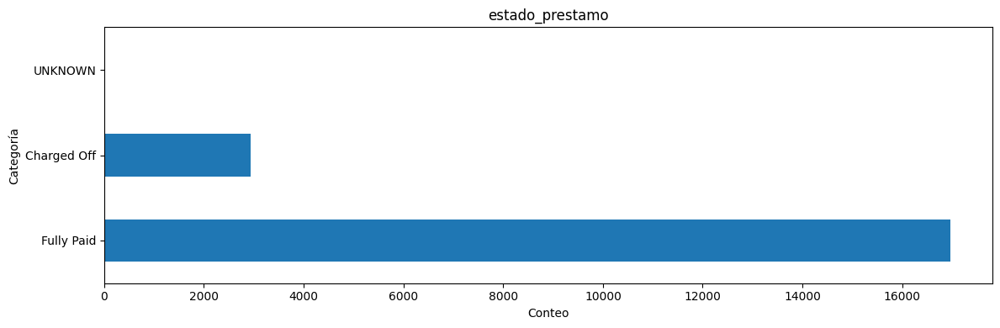

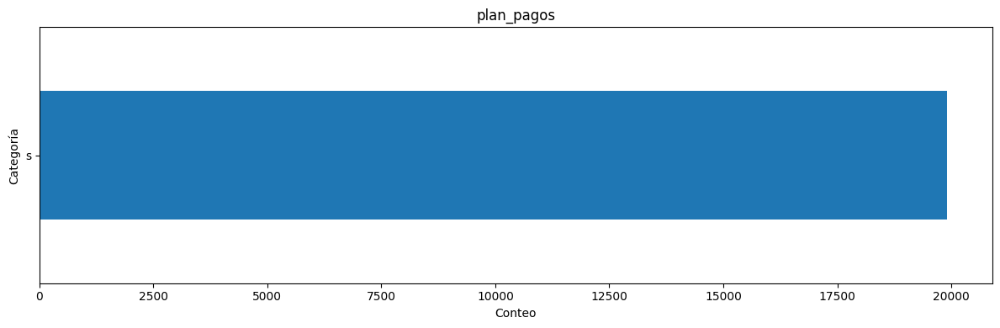

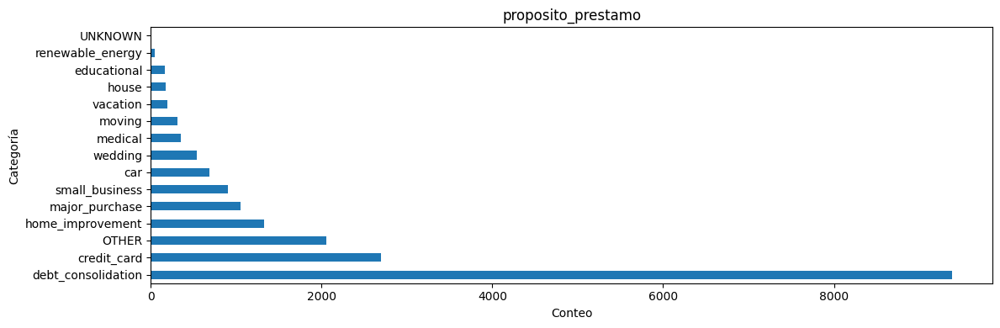

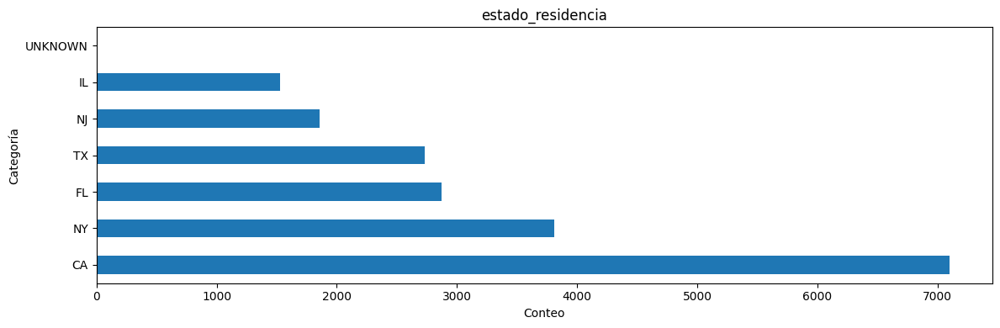

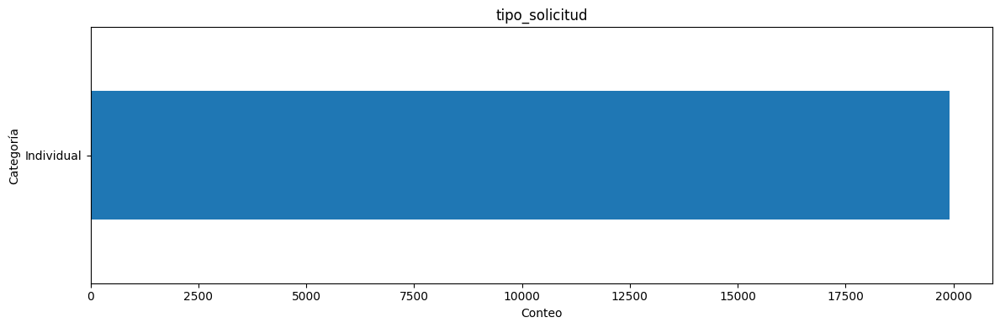

In [ ]:

for col in cols_cat:
    vc = Data_2[col].value_counts(dropna=False)

    plt.figure(figsize=(12, max(4, 0.25 * len(vc))))
    vc.plot(kind="barh")
    plt.title(col)
    plt.xlabel("Conteo")
    plt.ylabel("Categoría")
    plt.tight_layout()
    plt.show()

In [ ]:

for col in cols_cat:
    vc = Data_2[col].value_counts(dropna=False)
    pct = Data_2[col].value_counts(normalize=True, dropna=False) * 100

    tabla = pd.DataFrame({
        "categoria": vc.index.astype("string"),
        "conteo": vc.values,
        "porcentaje": pct.values
    })

    print("\n" + "="*70)
    print(f"{col} | n_unique (sin NaN) = {Data_2[col].nunique(dropna=True)}")
    print("="*70)
    print(tabla.to_string(index=False))



calificacion_crediticia | n_unique (sin NaN) = 7
categoria  conteo  porcentaje
        B    6065   30.465140
        A    4875   24.487643
        C    4087   20.529435
        D    2748   13.803496
        E    1434    7.203134
        F     540    2.712477
        G     159    0.798674

ocupacion | n_unique (sin NaN) = 202
                               categoria  conteo  porcentaje
                                   OTHER   16698   83.875829
                                 UNKNOWN    1185    5.952381
                         Bank of America      53    0.266225
                       Kaiser Permanente      50    0.251155
                     State of California      43    0.215994
                                 US Army      41    0.205947
                                    AT&T      36    0.180832
                         JP Morgan Chase      27    0.135624
                                     IBM      26    0.130601
                                 Verizon      24    0.120555
 


=== Cardinalidad por variable categórica ===


,n_unique
calificacion_crediticia,7
ocupacion,202
antiguedad_laboral,12
tenencia_vivienda,5
verificacion_ingreso,4
estado_prestamo,3
plan_pagos,1
proposito_prestamo,15
estado_residencia,7
tipo_solicitud,1



=== Top-10 categorías por variable ===

calificacion_crediticia — Conteo


,count
calificacion_crediticia,
B,6065
A,4875
C,4087
D,2748
E,1434
F,540
G,159


calificacion_crediticia — Porcentaje (%)


,pct
calificacion_crediticia,
B,30.47
A,24.49
C,20.53
D,13.80
E,7.20
F,2.71
G,0.80



ocupacion — Conteo


,count
ocupacion,
OTHER,16698
UNKNOWN,1185
Bank of America,53
Kaiser Permanente,50
State of California,43
US Army,41
AT&T,36
JP Morgan Chase,27
IBM,26


ocupacion — Porcentaje (%)


,pct
ocupacion,
OTHER,83.88
UNKNOWN,5.95
Bank of America,0.27
Kaiser Permanente,0.25
State of California,0.22
US Army,0.21
AT&T,0.18
JP Morgan Chase,0.14
IBM,0.13



antiguedad_laboral — Conteo


,count
antiguedad_laboral,
10+ year,4249
0-1 year,2304
2 year,2218
3 year,2108
4 year,1871
5 year,1649
1 year,1636
6 year,1151
7 year,867


antiguedad_laboral — Porcentaje (%)


,pct
antiguedad_laboral,
10+ year,21.34
0-1 year,11.57
2 year,11.14
3 year,10.59
4 year,9.40
5 year,8.28
1 year,8.22
6 year,5.78
7 year,4.36



tenencia_vivienda — Conteo


,count
tenencia_vivienda,
RENT,10965
MORTGAGE,7349
OWN,1546
OTHER,44
UNKNOWN,4


tenencia_vivienda — Porcentaje (%)


,pct
tenencia_vivienda,
RENT,55.08
MORTGAGE,36.91
OWN,7.77
OTHER,0.22
UNKNOWN,0.02



verificacion_ingreso — Conteo


,count
verificacion_ingreso,
Not Verified,8256
Verified,6464
Source Verified,5185
UNKNOWN,3


verificacion_ingreso — Porcentaje (%)


,pct
verificacion_ingreso,
Not Verified,41.47
Verified,32.47
Source Verified,26.04
UNKNOWN,0.02



estado_prestamo — Conteo


,count
estado_prestamo,
Fully Paid,16962
Charged Off,2943
UNKNOWN,3


estado_prestamo — Porcentaje (%)


,pct
estado_prestamo,
Fully Paid,85.20
Charged Off,14.78
UNKNOWN,0.02



plan_pagos — Conteo


,count
plan_pagos,
s,19908


plan_pagos — Porcentaje (%)


,pct
plan_pagos,
s,100.0



proposito_prestamo — Conteo


,count
proposito_prestamo,
debt_consolidation,9387
credit_card,2696
OTHER,2059
home_improvement,1330
major_purchase,1048
small_business,905
car,687
wedding,539
medical,350


proposito_prestamo — Porcentaje (%)


,pct
proposito_prestamo,
debt_consolidation,47.15
credit_card,13.54
OTHER,10.34
home_improvement,6.68
major_purchase,5.26
small_business,4.55
car,3.45
wedding,2.71
medical,1.76



estado_residencia — Conteo


,count
estado_residencia,
CA,7101
NY,3813
FL,2870
TX,2733
NJ,1855
IL,1525
UNKNOWN,11


estado_residencia — Porcentaje (%)


,pct
estado_residencia,
CA,35.67
NY,19.15
FL,14.42
TX,13.73
NJ,9.32
IL,7.66
UNKNOWN,0.06



tipo_solicitud — Conteo


,count
tipo_solicitud,
Individual,19908


tipo_solicitud — Porcentaje (%)


,pct
tipo_solicitud,
Individual,100.0


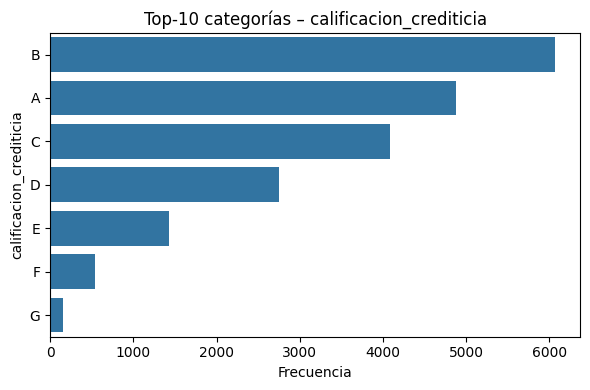

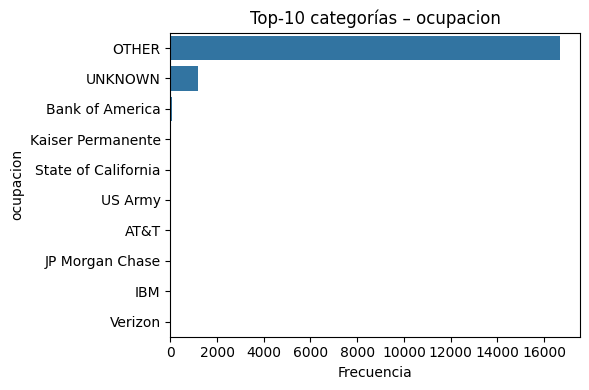

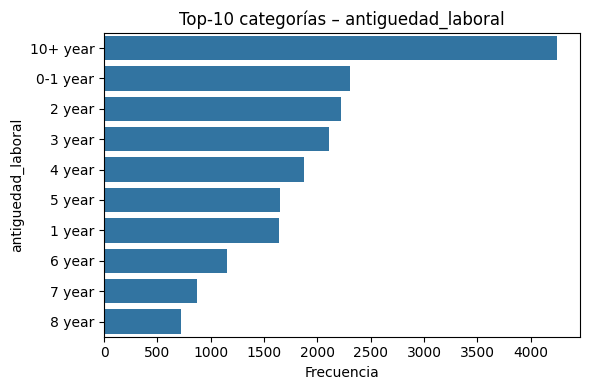

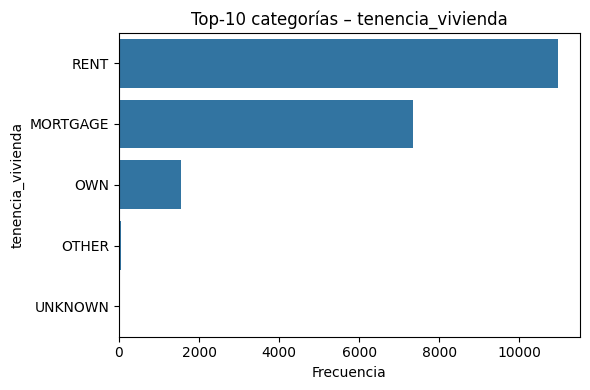

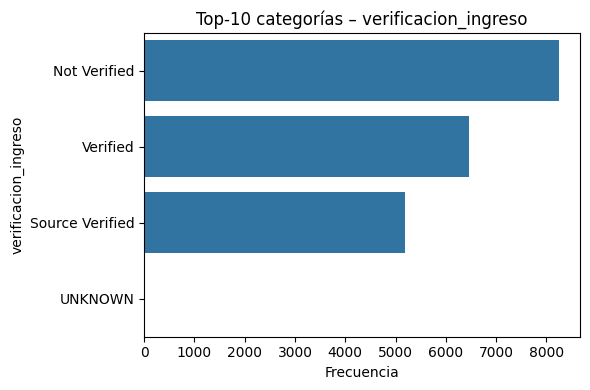

...

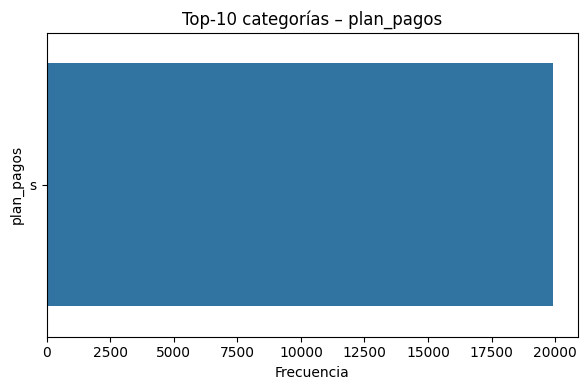

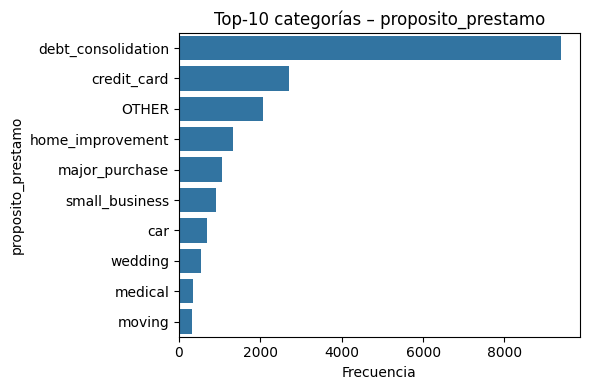

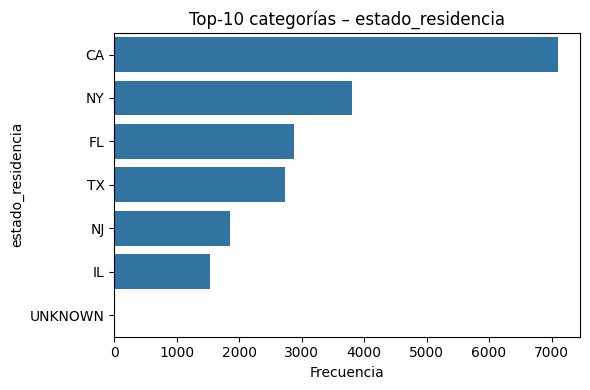

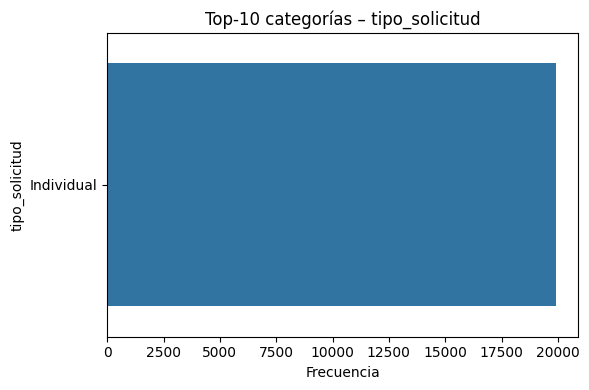

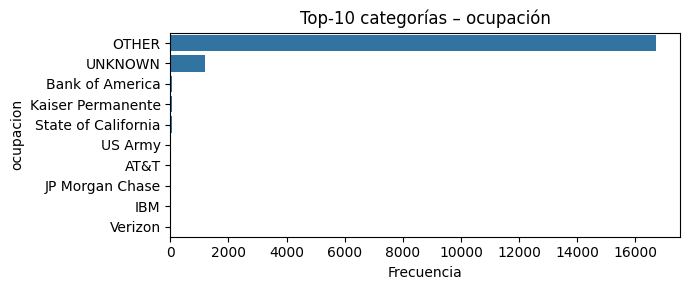


=== Long tail: concentración Top-1 y Top-5 ===

calificacion_crediticia
% Top-1 : 30.47%
% Top-5 : 96.49%

ocupacion
% Top-1 : 83.88%
% Top-5 : 90.56%

antiguedad_laboral
% Top-1 : 21.34%
% Top-5 : 64.04%

tenencia_vivienda
% Top-1 : 55.08%
% Top-5 : 100.00%

verificacion_ingreso
% Top-1 : 41.47%
% Top-5 : 100.00%

estado_prestamo
% Top-1 : 85.20%
% Top-5 : 100.00%

plan_pagos
% Top-1 : 100.00%
% Top-5 : 100.00%

proposito_prestamo
% Top-1 : 47.15%
% Top-5 : 82.98%

estado_residencia
% Top-1 : 35.67%
% Top-5 : 92.28%

tipo_solicitud
% Top-1 : 100.00%
% Top-5 : 100.00%


In [ ]:

print("\n=== Cardinalidad por variable categórica ===")
display(
    Data_2[cols_cat]
    .nunique(dropna=False)
    .to_frame("n_unique")
)


print("\n=== Top-10 categorías por variable ===")
for col in cols_cat:
    print(f"\n{col} — Conteo")
    display(
        Data_2[col]
        .value_counts(dropna=False)
        .head(10)
    )

    print(f"{col} — Porcentaje (%)")
    display(
        Data_2[col]
        .value_counts(normalize=True, dropna=False)
        .head(10)
        .mul(100)
        .round(2)
        .to_frame("pct")
    )


for col in cols_cat:
    top10 = Data_2[col].value_counts(dropna=False).head(10).index

    plt.figure(figsize=(6, 4))
    sns.countplot(
        y=Data_2[col],
        order=top10
    )
    plt.title(f"Top-10 categorías – {col}")
    plt.xlabel("Frecuencia")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()


c = "ocupacion"


top10_vals = (
    Data_2[c]
    .value_counts()
    .drop(index=["Missing", "Other"], errors="ignore")
    .head(10)
    .index
)

plt.figure(figsize=(7, 3))
sns.countplot(
    data=Data_2[Data_2[c].isin(top10_vals)],
    y=c,
    order=top10_vals
)

plt.title("Top-10 categorías – ocupación")
plt.xlabel("Frecuencia")
plt.ylabel(c)
plt.tight_layout()
plt.show()

print("\n=== Long tail: concentración Top-1 y Top-5 ===")
for col in cols_cat:
    vc = (
        Data_2[col]
        .value_counts(normalize=True, dropna=False)
        .mul(100)
    )

    top1 = vc.iloc[0]
    top5 = vc.iloc[:5].sum()

    print(f"\n{col}")
    print(f"% Top-1 : {top1:.2f}%")
    print(f"% Top-5 : {top5:.2f}%")

#5. Análisis Exploratorio Bivariado (EDA): Variables Explicativas vs Target

## 5.1 Variables Numéricas vs Target

<Figure size 640x480 with 0 Axes>

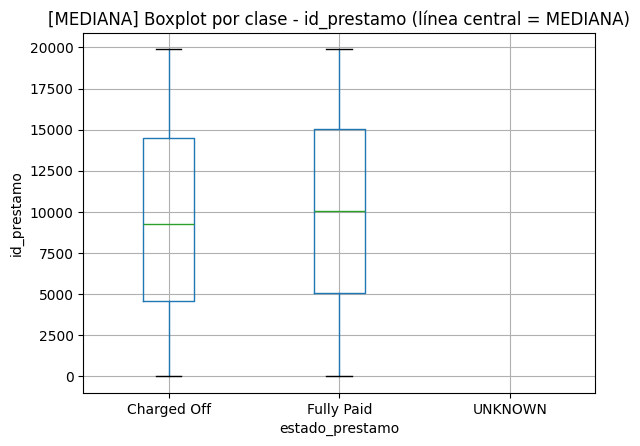

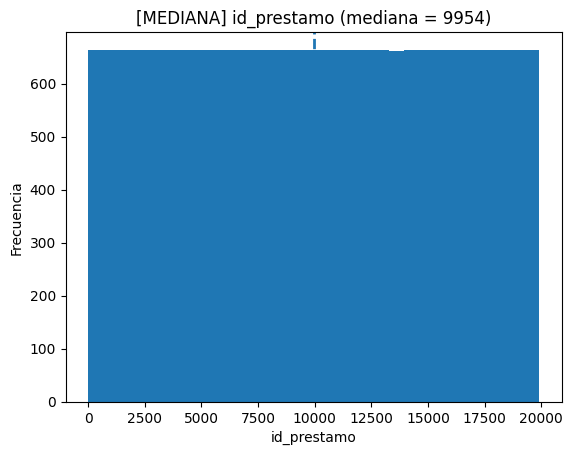

<Figure size 640x480 with 0 Axes>

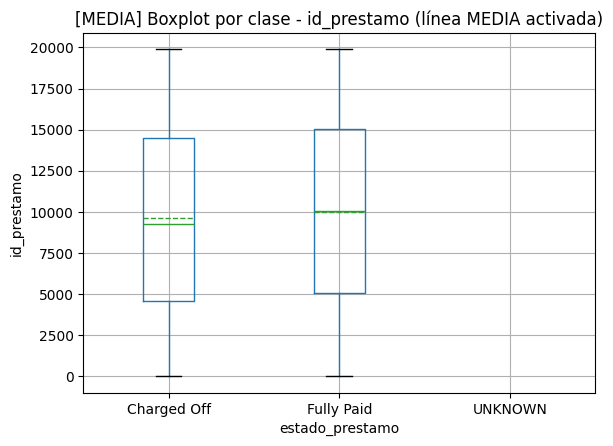

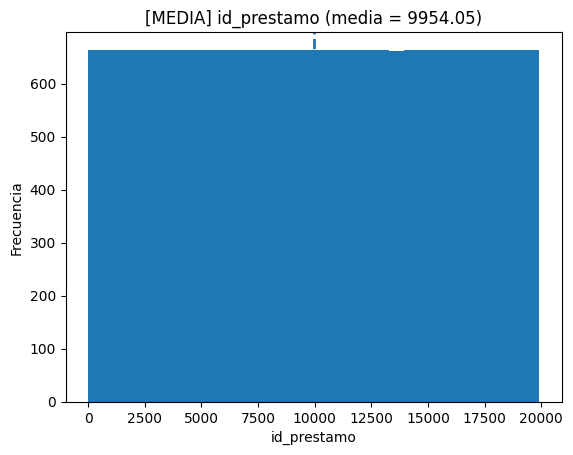


VARIABLE: id_prestamo
Evento (positivo) = Charged Off
MEDIA = 9954.05 | MEDIANA = 9954

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
       bucket_quintil  tasa_evento     n
0     (0.999, 3981.8]     0.162271  3981
1    (3981.8, 7963.6]     0.158754  3981
2   (7963.6, 11944.4]     0.140166  3981
3  (11944.4, 15926.2]     0.139412  3981
4  (15926.2, 19908.0]     0.138659  3981

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
      bucket_mediana  tasa_evento     n
0  <= MEDIANA (9954)     0.156134  9953
1   > MEDIANA (9954)     0.139570  9952

[TENDENCIA QUINTILES] decreciente


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

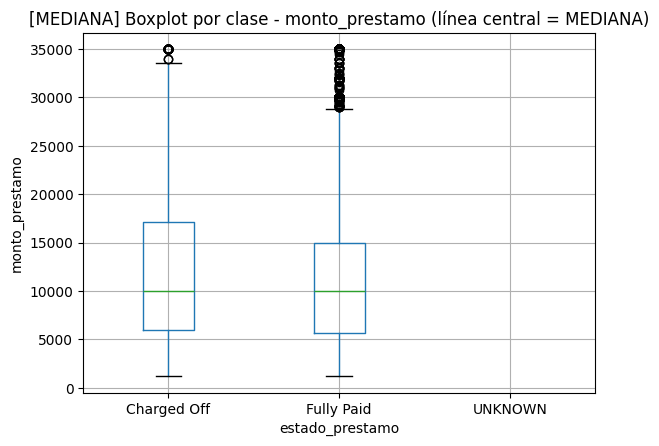

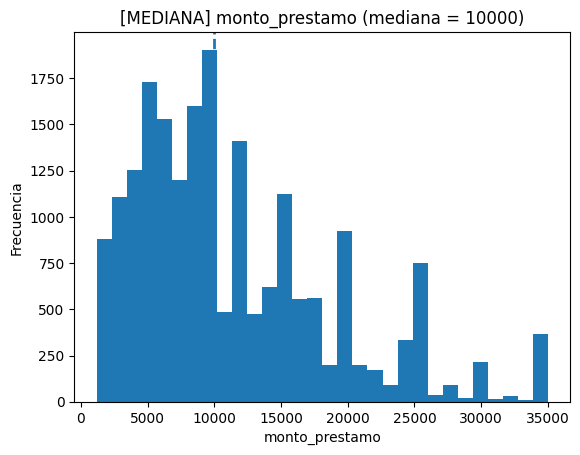

<Figure size 640x480 with 0 Axes>

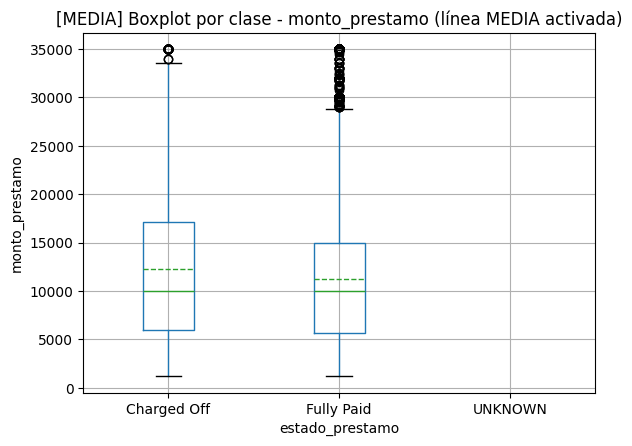

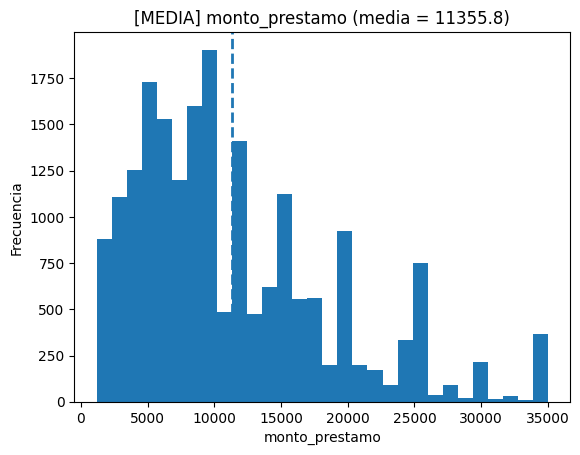


VARIABLE: monto_prestamo
Evento (positivo) = Charged Off
MEDIA = 11355.8 | MEDIANA = 10000

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
       bucket_quintil  tasa_evento     n
0  (1199.999, 5000.0]     0.147946  4576
1    (5000.0, 8000.0]     0.125250  4000
2   (8000.0, 12000.0]     0.132326  4436
3  (12000.0, 17000.0]     0.148024  2986
4  (17000.0, 35000.0]     0.188380  3907

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
       bucket_mediana  tasa_evento      n
0  <= MEDIANA (10000)     0.138573  11171
1   > MEDIANA (10000)     0.159721   8734

[TENDENCIA QUINTILES] no monotónica


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

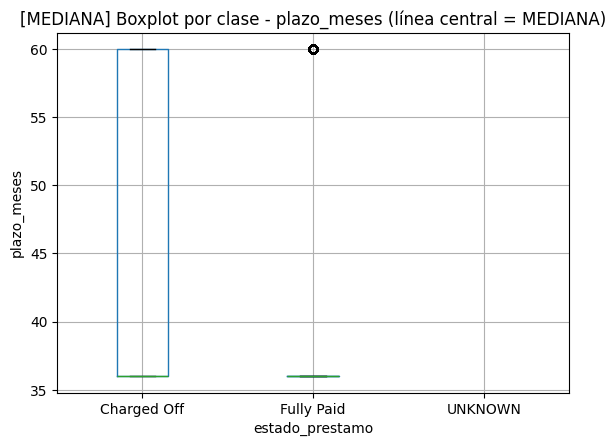

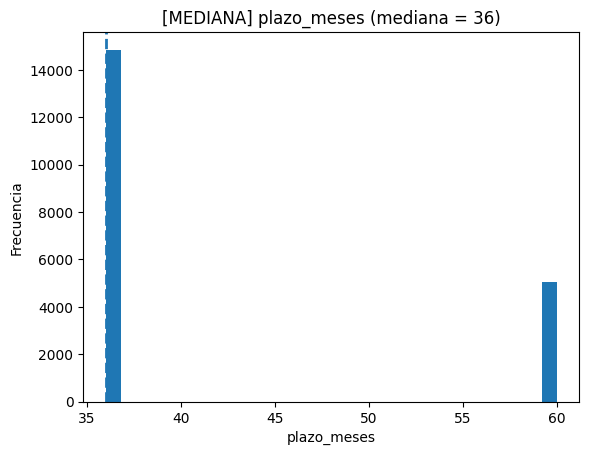

<Figure size 640x480 with 0 Axes>

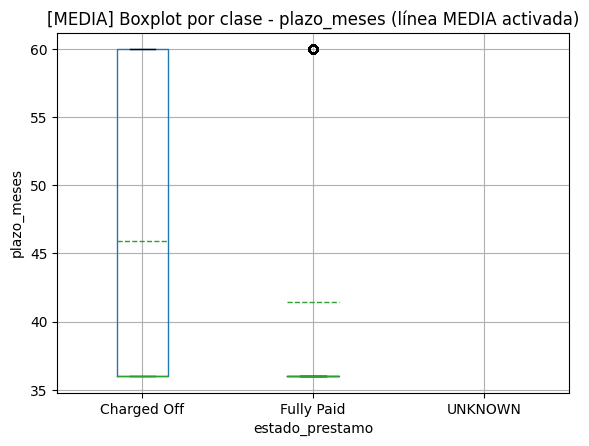

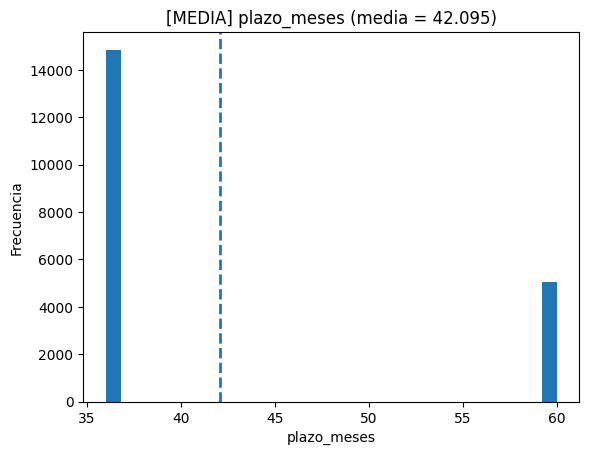


VARIABLE: plazo_meses
Evento (positivo) = Charged Off
MEDIA = 42.095 | MEDIANA = 36

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
   bucket_quintil  tasa_evento      n
0  (35.999, 60.0]     0.147852  19905

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
    bucket_mediana  tasa_evento      n
0  <= MEDIANA (36)     0.116364  14850
1   > MEDIANA (36)     0.240356   5055

[TENDENCIA QUINTILES] no evaluable


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

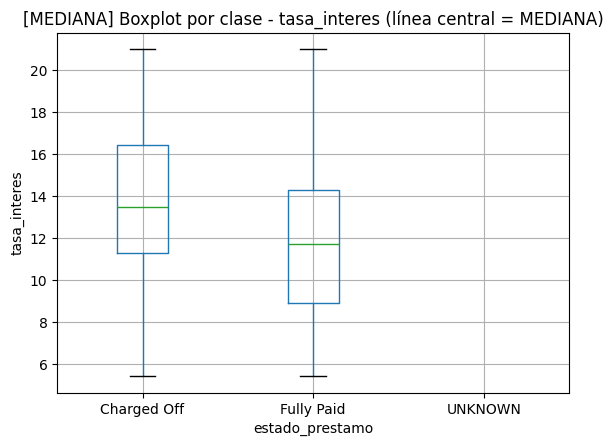

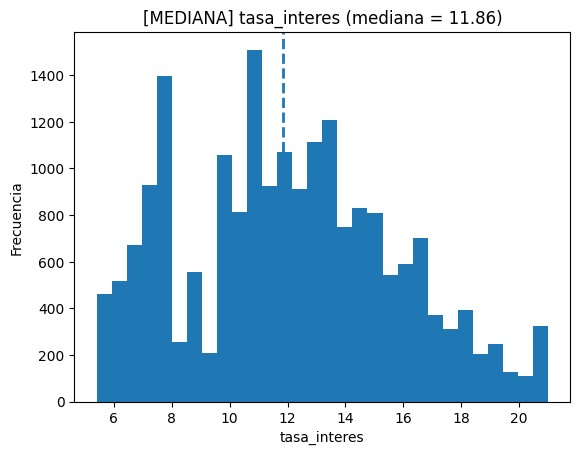

<Figure size 640x480 with 0 Axes>

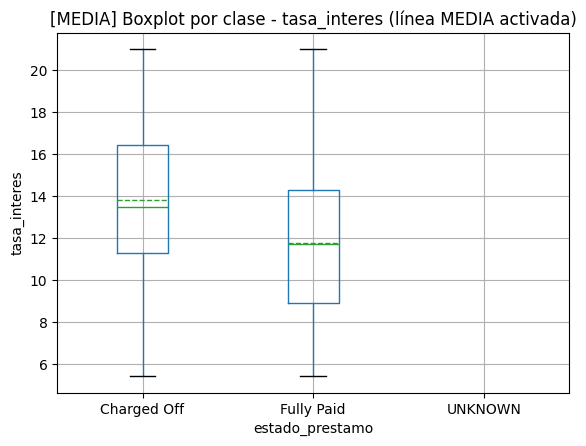

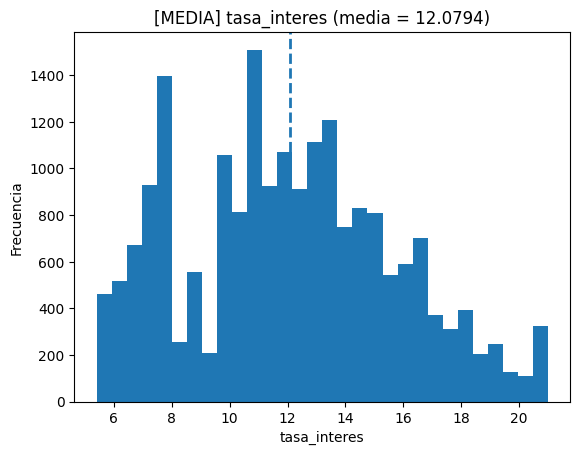


VARIABLE: tasa_interes
Evento (positivo) = Charged Off
MEDIA = 12.0794 | MEDIANA = 11.86

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
   bucket_quintil  tasa_evento     n
0   (5.419, 8.32]     0.054596  3993
1   (8.32, 10.99]     0.112124  4058
2  (10.99, 12.99]     0.151733  4040
3  (12.99, 15.28]     0.168591  3897
4  (15.28, 20.99]     0.255297  3917

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
       bucket_mediana  tasa_evento     n
0  <= MEDIANA (11.86)     0.095119  9977
1   > MEDIANA (11.86)     0.200846  9928

[TENDENCIA QUINTILES] creciente


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

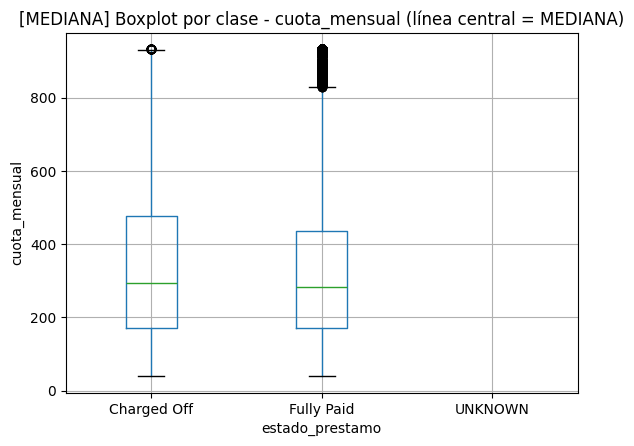

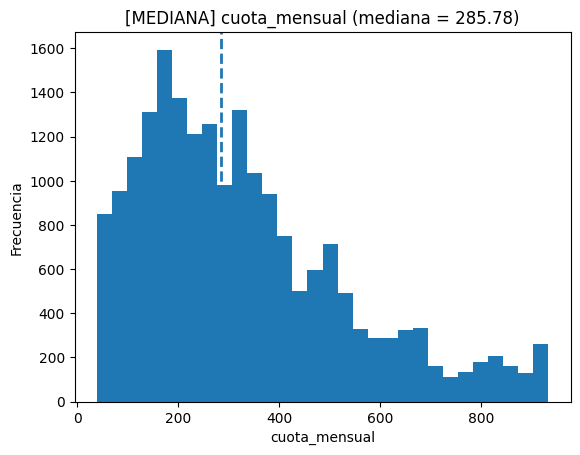

<Figure size 640x480 with 0 Axes>

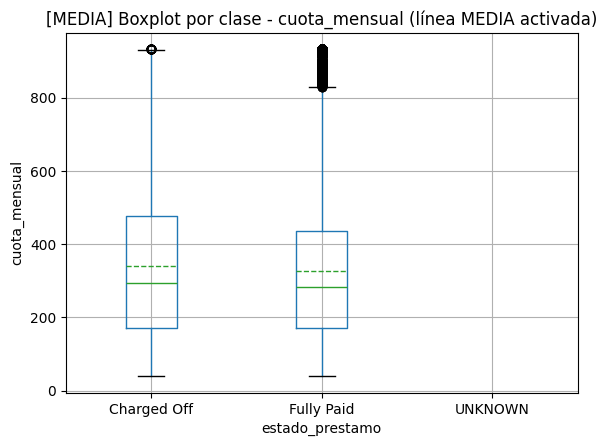

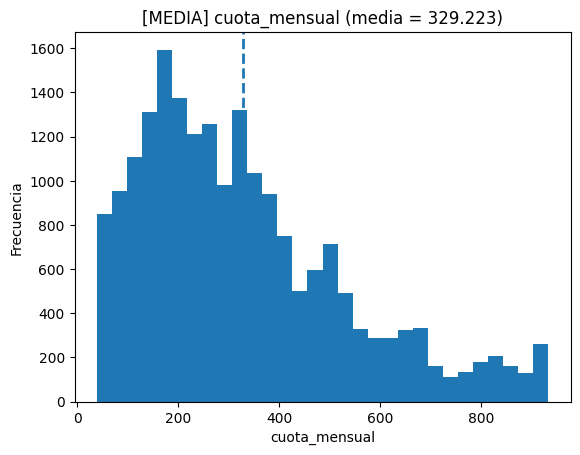


VARIABLE: cuota_mensual
Evento (positivo) = Charged Off
MEDIA = 329.223 | MEDIANA = 285.78

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
                  bucket_quintil  tasa_evento     n
0  (39.144000000000005, 154.708]     0.151218  3981
1              (154.708, 238.15]     0.137230  3986
2              (238.15, 336.728]     0.137575  3976
3              (336.728, 491.03]     0.141602  3983
4              (491.03, 933.134]     0.171651  3979

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
        bucket_mediana  tasa_evento     n
0  <= MEDIANA (285.78)     0.143273  9953
1   > MEDIANA (285.78)     0.152432  9952

[TENDENCIA QUINTILES] no monotónica


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

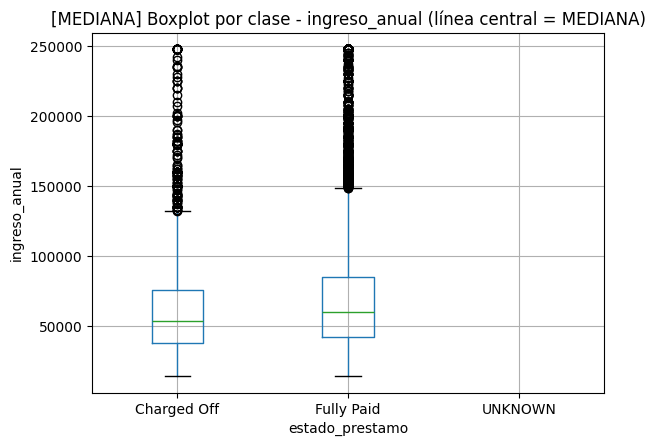

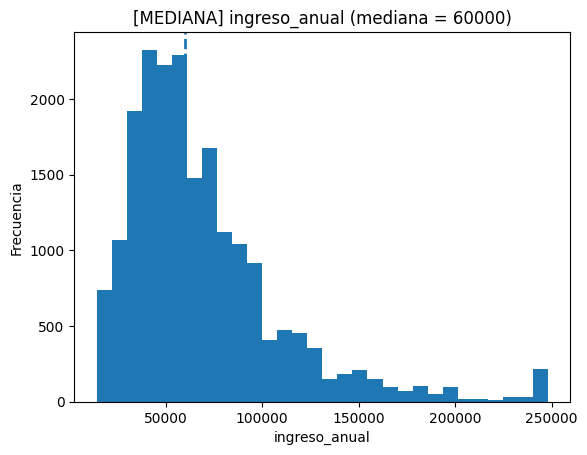

<Figure size 640x480 with 0 Axes>

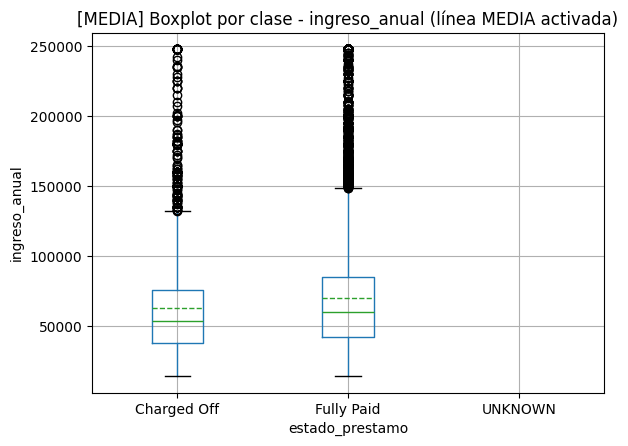

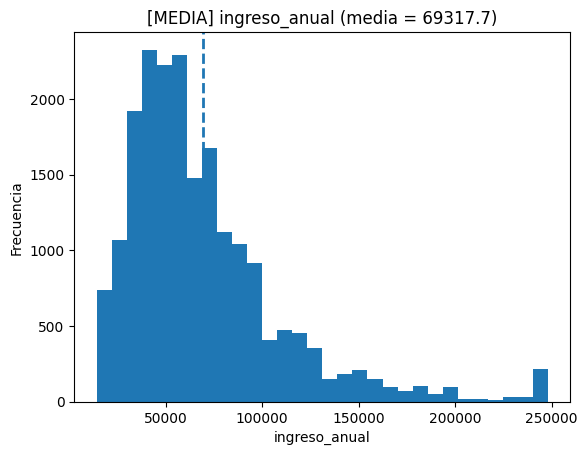


VARIABLE: ingreso_anual
Evento (positivo) = Charged Off
MEDIA = 69317.7 | MEDIANA = 60000

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
         bucket_quintil  tasa_evento     n
0  (14399.999, 38400.0]     0.184581  3982
1    (38400.0, 52000.0]     0.164994  4085
2    (52000.0, 68000.0]     0.145631  3914
3    (68000.0, 93000.0]     0.130952  3948
4  (93000.0, 248003.72]     0.112425  3976

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
       bucket_mediana  tasa_evento      n
0  <= MEDIANA (60000)      0.16971  10459
1   > MEDIANA (60000)      0.12365   9446

[TENDENCIA QUINTILES] decreciente


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

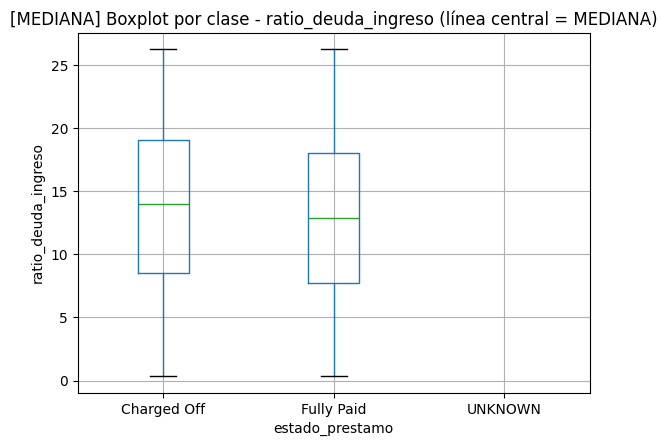

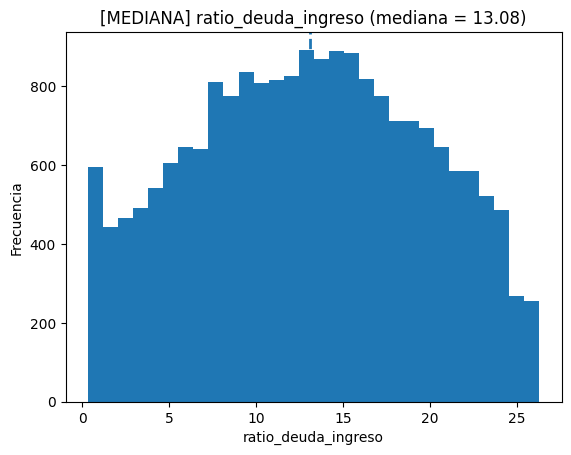

<Figure size 640x480 with 0 Axes>

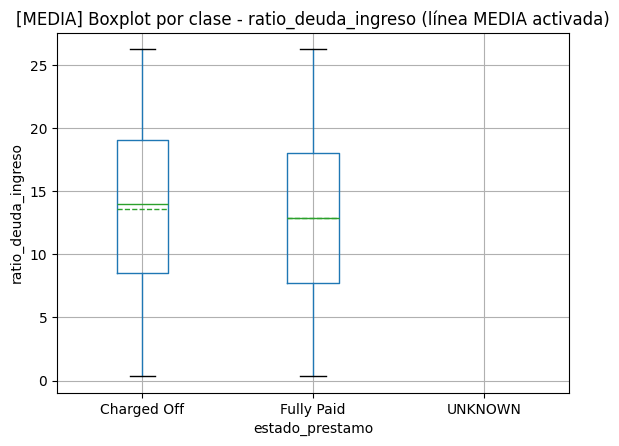

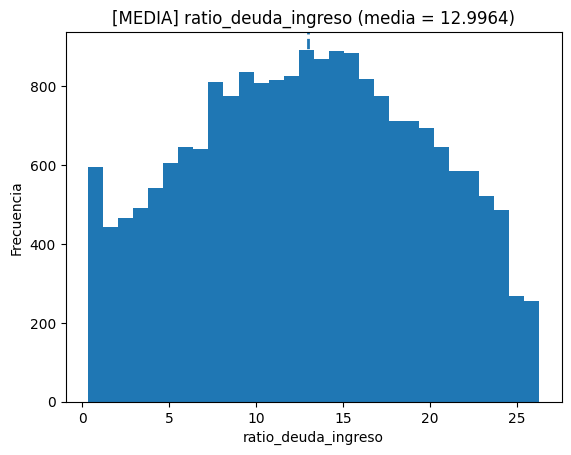


VARIABLE: ratio_deuda_ingreso
Evento (positivo) = Charged Off
MEDIA = 12.9964 | MEDIANA = 13.08

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
   bucket_quintil  tasa_evento     n
0   (0.35, 6.648]     0.134137  3981
1  (6.648, 11.02]     0.132530  3984
2  (11.02, 15.02]     0.143394  3989
3  (15.02, 19.44]     0.157868  3978
4  (19.44, 26.26]     0.171407  3973

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
       bucket_mediana  tasa_evento     n
0  <= MEDIANA (13.08)     0.134604  9970
1   > MEDIANA (13.08)     0.161147  9935

[TENDENCIA QUINTILES] no monotónica


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

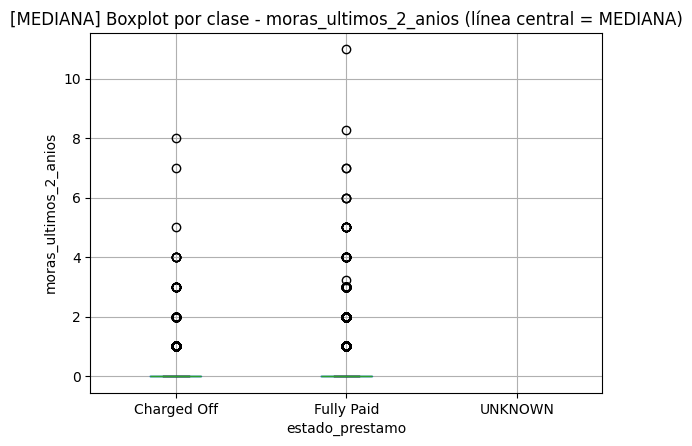

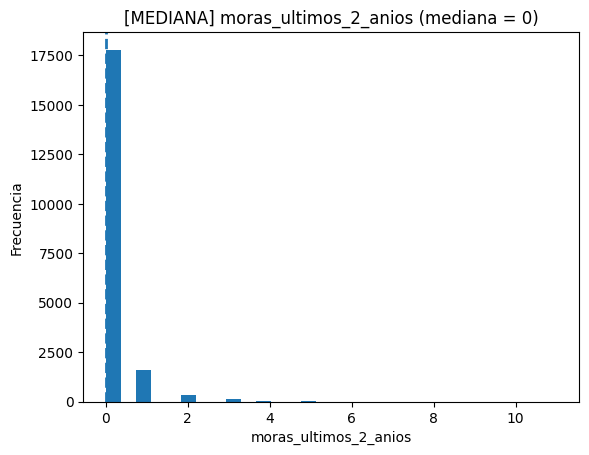

<Figure size 640x480 with 0 Axes>

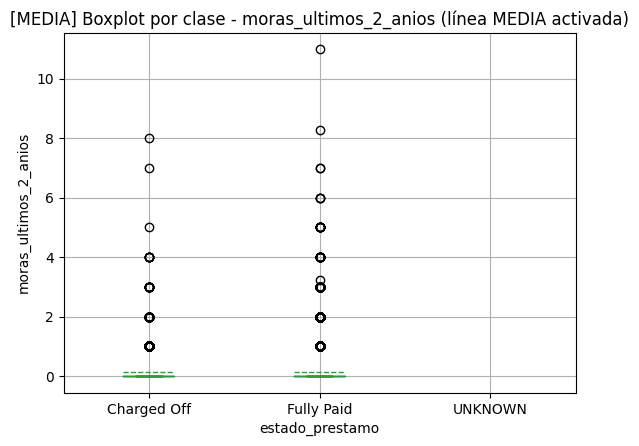

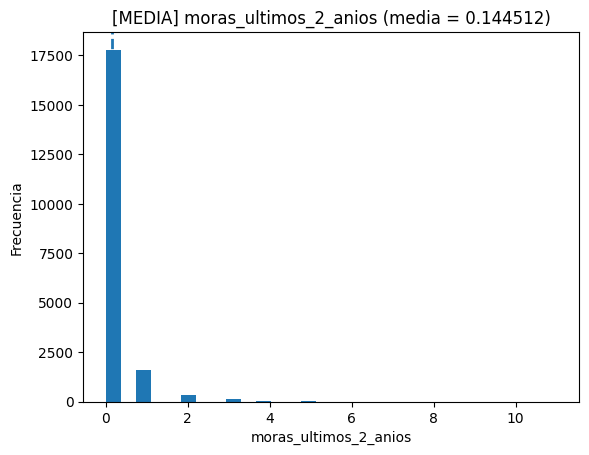


VARIABLE: moras_ultimos_2_anios
Evento (positivo) = Charged Off
MEDIA = 0.144512 | MEDIANA = 0

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
   bucket_quintil  tasa_evento      n
0  (-0.001, 11.0]     0.147852  19905

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
   bucket_mediana  tasa_evento      n
0  <= MEDIANA (0)     0.146520  17786
1   > MEDIANA (0)     0.159037   2119

[TENDENCIA QUINTILES] no evaluable


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

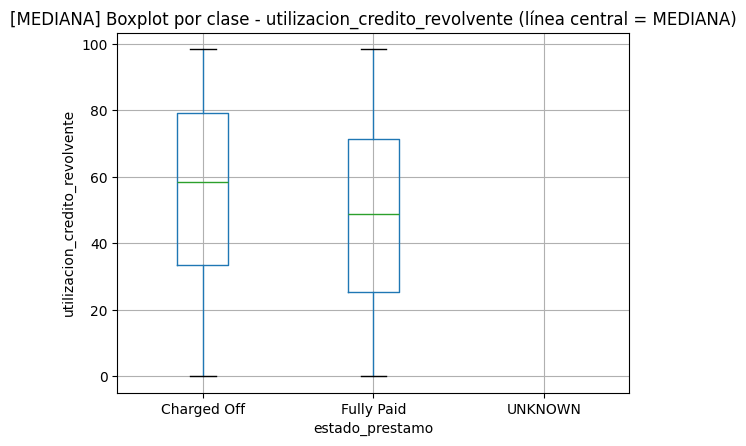

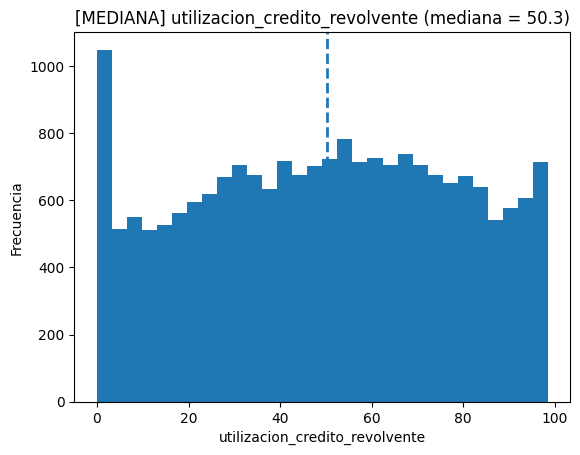

<Figure size 640x480 with 0 Axes>

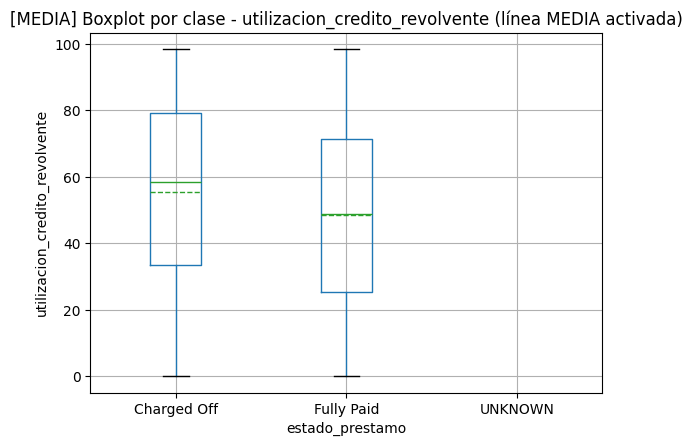

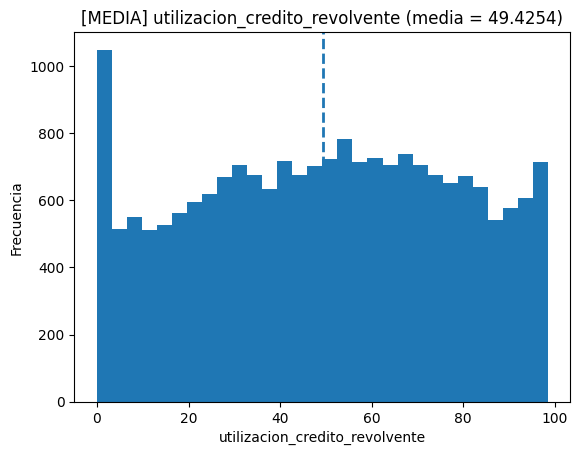


VARIABLE: utilizacion_credito_revolvente
Evento (positivo) = Charged Off
MEDIA = 49.4254 | MEDIANA = 50.3

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
   bucket_quintil  tasa_evento     n
0  (-0.001, 21.1]     0.108271  3990
1    (21.1, 41.0]     0.123123  3996
2    (41.0, 59.1]     0.144042  3978
3    (59.1, 77.6]     0.165828  3974
4    (77.6, 98.5]     0.198387  3967

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
      bucket_mediana  tasa_evento     n
0  <= MEDIANA (50.3)     0.120240  9980
1   > MEDIANA (50.3)     0.175617  9925

[TENDENCIA QUINTILES] creciente


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

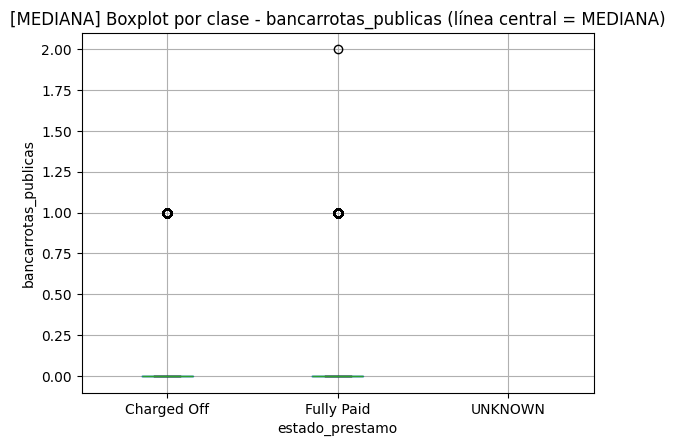

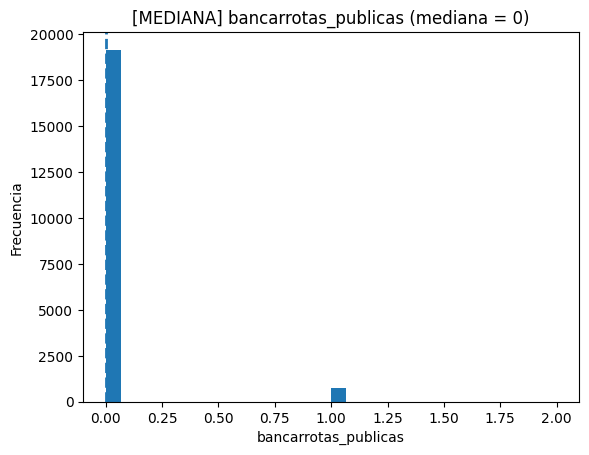

<Figure size 640x480 with 0 Axes>

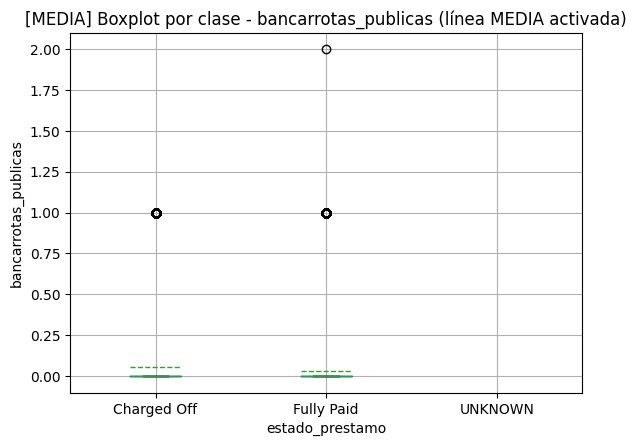

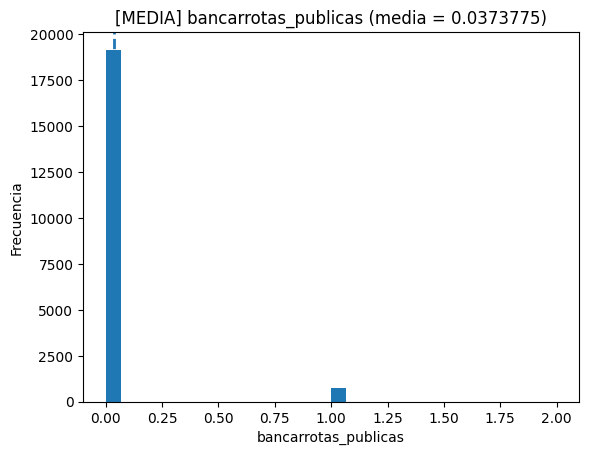


VARIABLE: bancarrotas_publicas
Evento (positivo) = Charged Off
MEDIA = 0.0373775 | MEDIANA = 0

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
  bucket_quintil  tasa_evento      n
0  (-0.001, 2.0]     0.147852  19905

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
   bucket_mediana  tasa_evento      n
0  <= MEDIANA (0)     0.145235  19162
1   > MEDIANA (0)     0.215343    743

[TENDENCIA QUINTILES] no evaluable


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

<Figure size 640x480 with 0 Axes>

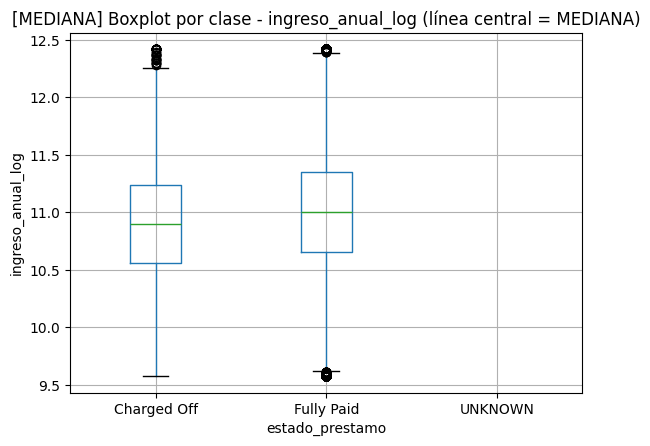

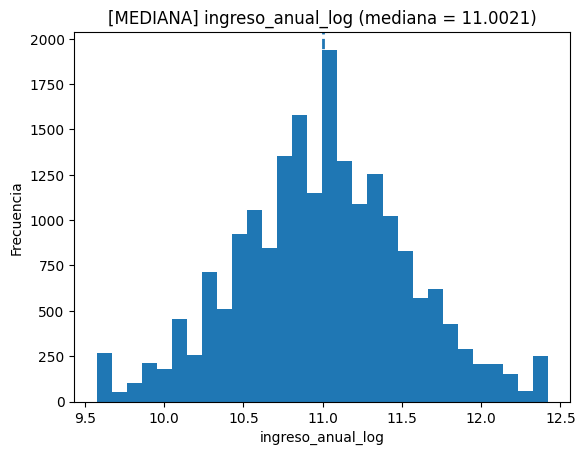

<Figure size 640x480 with 0 Axes>

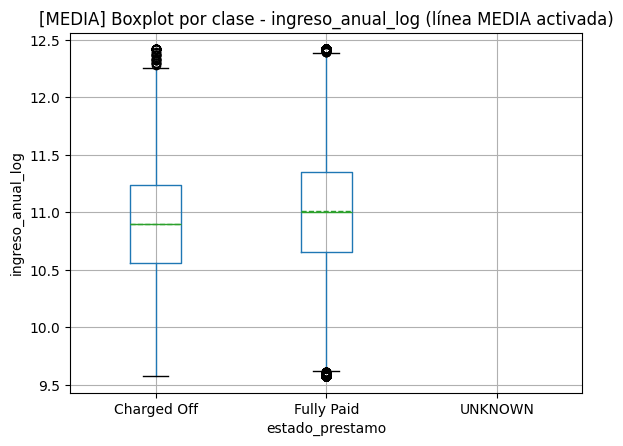

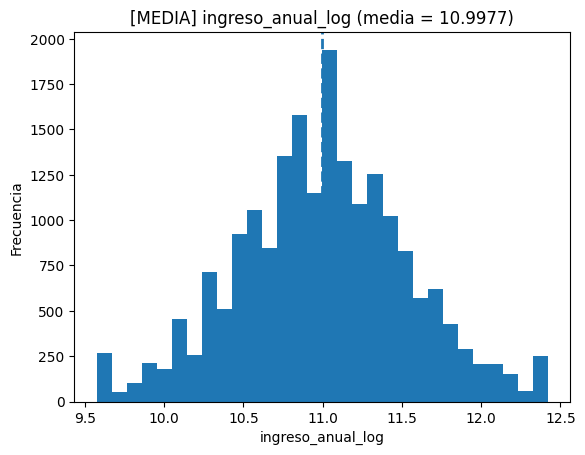


VARIABLE: ingreso_anual_log
Evento (positivo) = Charged Off
MEDIA = 10.9977 | MEDIANA = 11.0021

[BUCKETS QUINTILES] q=5 -> tasa_evento + n
     bucket_quintil  tasa_evento     n
0   (9.574, 10.556]     0.184581  3982
1  (10.556, 10.859]     0.164994  4085
2  (10.859, 11.127]     0.145631  3914
3   (11.127, 11.44]     0.130952  3948
4   (11.44, 12.421]     0.112425  3976

[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n
         bucket_mediana  tasa_evento      n
0  <= MEDIANA (11.0021)      0.16971  10459
1   > MEDIANA (11.0021)      0.12365   9446

[TENDENCIA QUINTILES] decreciente


/tmp/ipython-input-473217600.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_q = y_bin.groupby(buckets_q).mean()
/tmp/ipython-input-473217600.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_q = y_bin.groupby(buckets_q).size()
/tmp/ipython-input-473217600.py:102: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa_m = y_bin.groupby(buckets_m).mean()
/tmp/ipython-input-473217600.py:103: FutureWarning: The d

In [ ]:
TARGET = "estado_prestamo"
POSITIVE = "Charged Off"


valid_y = Data_2[TARGET].isin(["Fully Paid", "Charged Off"])


cols_num = Data_2.select_dtypes(include="number").columns.tolist()

def _tendencia_desde_tasa(tasas):
    d = tasas.diff().dropna()
    if len(d) == 0:
        return "no evaluable"
    if (d > 0).all():
        return "creciente"
    if (d < 0).all():
        return "decreciente"
    return "no monotónica"

def analizar_numerica_vs_target(col, q=5):

    mask = valid_y & Data_2[col].notna()
    if mask.sum() == 0:
        print(f"\n{col}: sin datos válidos (NaN o target inválido).")
        return


    y_bin = (Data_2.loc[mask, TARGET] == POSITIVE).astype(int)


    med = float(Data_2.loc[mask, col].median())
    mean = float(Data_2.loc[mask, col].mean())


    plt.figure()
    Data_2.loc[mask].boxplot(column=col, by=TARGET, showmeans=False)
    plt.title(f"[MEDIANA] Boxplot por clase - {col} (línea central = MEDIANA)")
    plt.suptitle("")
    plt.xlabel(TARGET)
    plt.ylabel(col)
    plt.show()


    plt.figure()
    Data_2.loc[mask, col].plot(kind="hist", bins=30)
    plt.axvline(med, linestyle="--", linewidth=2)
    plt.title(f"[MEDIANA] {col} (mediana = {med:.6g})")
    plt.xlabel(col)
    plt.ylabel("Frecuencia")
    plt.show()


    plt.figure()
    Data_2.loc[mask].boxplot(column=col, by=TARGET, showmeans=True, meanline=True)
    plt.title(f"[MEDIA] Boxplot por clase - {col} (línea MEDIA activada)")
    plt.suptitle("")
    plt.xlabel(TARGET)
    plt.ylabel(col)
    plt.show()


    plt.figure()
    Data_2.loc[mask, col].plot(kind="hist", bins=30)
    plt.axvline(mean, linestyle="--", linewidth=2)
    plt.title(f"[MEDIA] {col} (media = {mean:.6g})")
    plt.xlabel(col)
    plt.ylabel("Frecuencia")
    plt.show()


    buckets_q = pd.qcut(Data_2.loc[mask, col], q=q, duplicates="drop")
    tasa_q = y_bin.groupby(buckets_q).mean()
    n_q = y_bin.groupby(buckets_q).size()

    tabla_q = pd.DataFrame({
        "bucket_quintil": tasa_q.index.astype("string"),
        "tasa_evento": tasa_q.values,
        "n": n_q.values
    })


    buckets_m = pd.cut(
        Data_2.loc[mask, col],
        bins=[-float("inf"), med, float("inf")],
        include_lowest=True,
        right=True,
        labels=[f"<= MEDIANA ({med:.6g})", f"> MEDIANA ({med:.6g})"]
    )
    tasa_m = y_bin.groupby(buckets_m).mean()
    n_m = y_bin.groupby(buckets_m).size()

    tabla_m = pd.DataFrame({
        "bucket_mediana": tasa_m.index.astype("string"),
        "tasa_evento": tasa_m.values,
        "n": n_m.values
    })


    tendencia = _tendencia_desde_tasa(tasa_q)


    print("\n" + "="*90)
    print(f"VARIABLE: {col}")
    print(f"Evento (positivo) = {POSITIVE}")
    print(f"MEDIA = {mean:.6g} | MEDIANA = {med:.6g}")
    print("="*90)

    print("\n[BUCKETS QUINTILES] q=5 -> tasa_evento + n")
    print(tabla_q)

    print("\n[BUCKETS MEDIANA] <= mediana vs > mediana -> tasa_evento + n")
    print(tabla_m)

    print(f"\n[TENDENCIA QUINTILES] {tendencia}")

for col in cols_num:
    analizar_numerica_vs_target(col, q=5)



## 5.2 Variables Categóricas vs Target


CATEGÓRICA: calificacion_crediticia | Target positivo = Charged Off
                            n  tasa_evento
calificacion_crediticia                   
B                        6064     0.128463
A                        4875     0.062359
C                        4086     0.164464
D                        2748     0.210699
E                        1433     0.263782
F                         540     0.322222
G                         159     0.358491


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


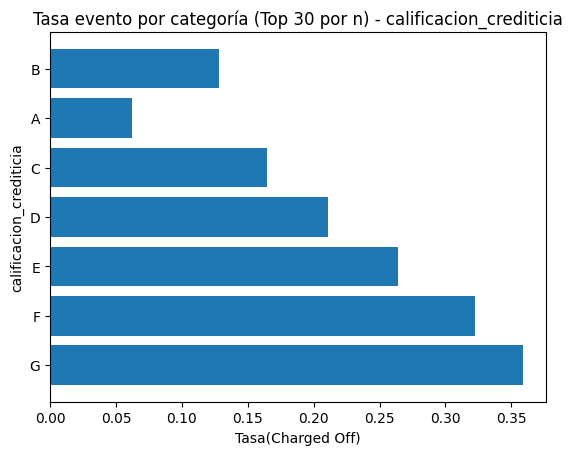

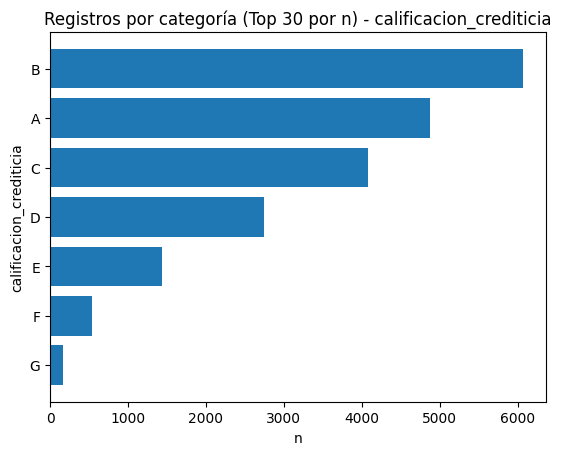

/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()



CATEGÓRICA: ocupacion | Target positivo = Charged Off
                                   n  tasa_evento
ocupacion                                        
OTHER                          16695     0.147948
UNKNOWN                         1185     0.194093
Bank of America                   53     0.188679
Kaiser Permanente                 50     0.160000
State of California               43     0.093023
...                              ...          ...
Verizon Business                   5     0.000000
Weill Cornell Medical College      5     0.000000
retired                            5     0.200000
us postal service                  5     0.200000
usps                               5     0.000000

[202 rows x 2 columns]


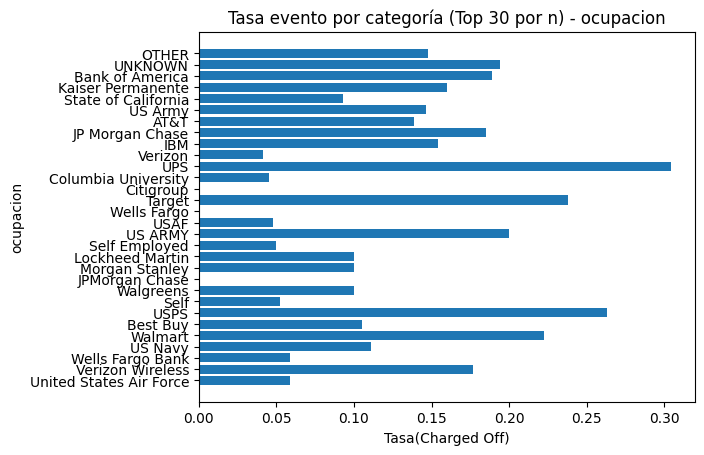

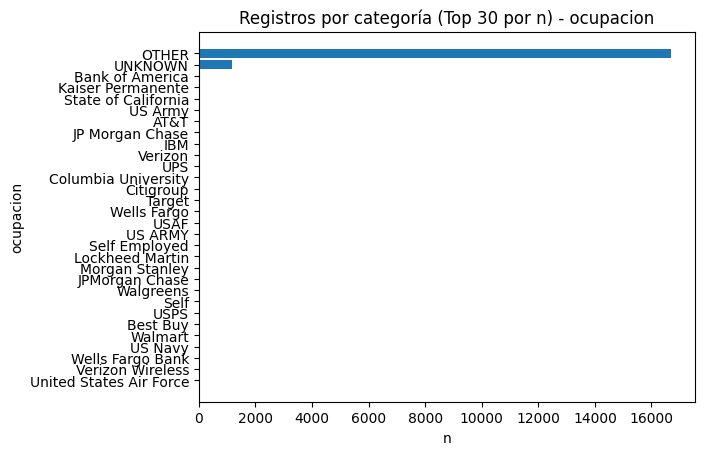


CATEGÓRICA: antiguedad_laboral | Target positivo = Charged Off
                       n  tasa_evento
antiguedad_laboral                   
10+ year            4249     0.162862
0-1 year            2304     0.137153
2 year              2218     0.125789
3 year              2108     0.135674
4 year              1871     0.142170
5 year              1649     0.156458
1 year              1636     0.147922
6 year              1151     0.154648
7 year               867     0.149942
8 year               718     0.151811
9 year               635     0.130709
UNKNOWN              499     0.208417


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


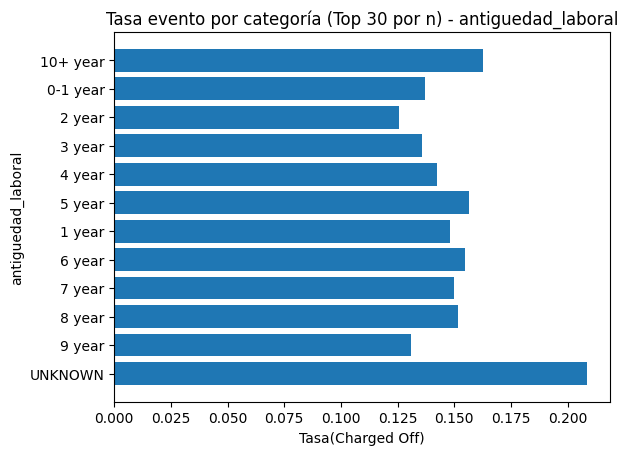

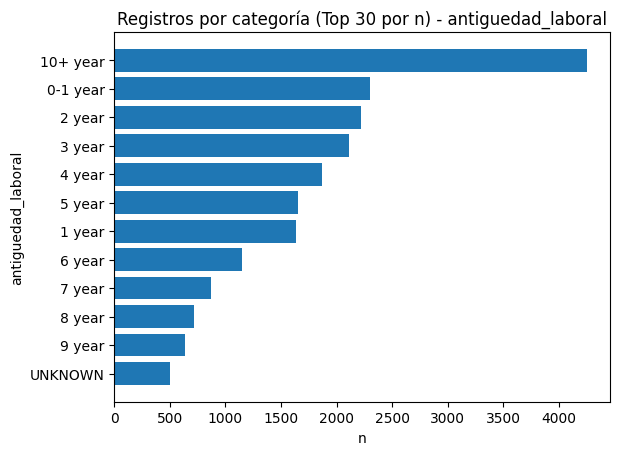


CATEGÓRICA: tenencia_vivienda | Target positivo = Charged Off
                       n  tasa_evento
tenencia_vivienda                    
RENT               10965     0.152394
MORTGAGE            7349     0.138658
OWN                 1546     0.158473
OTHER                 44     0.181818
UNKNOWN                1     0.000000


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


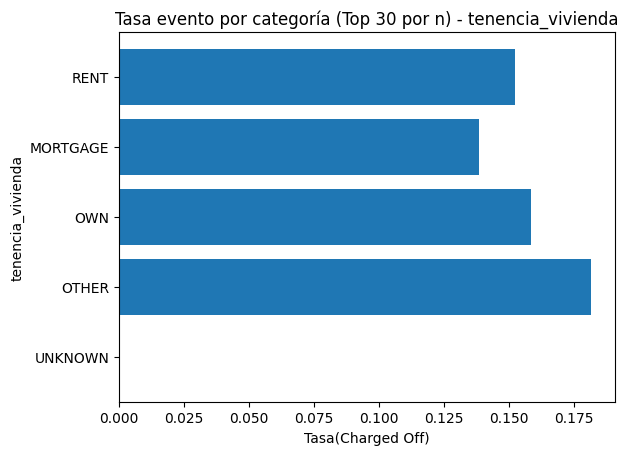

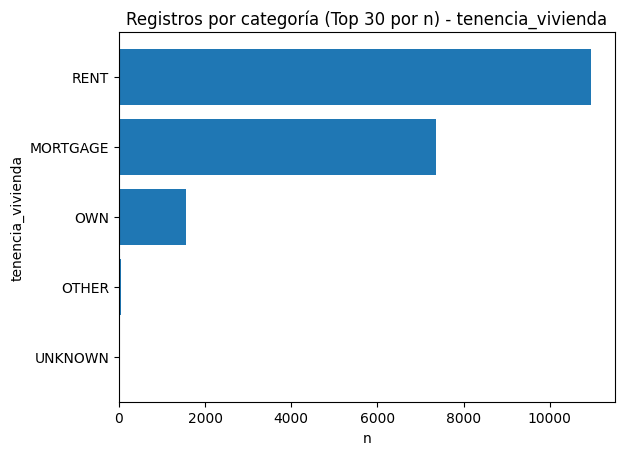


CATEGÓRICA: verificacion_ingreso | Target positivo = Charged Off
                         n  tasa_evento
verificacion_ingreso                   
Not Verified          8256     0.132025
Verified              6464     0.168007
Source Verified       5185     0.147927
UNKNOWN                  0          NaN


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


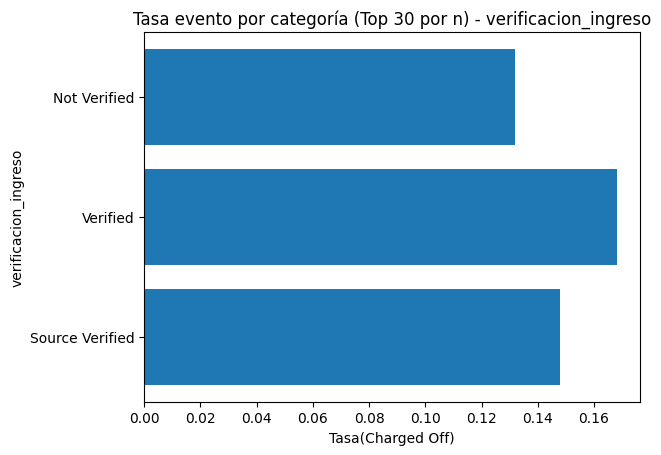

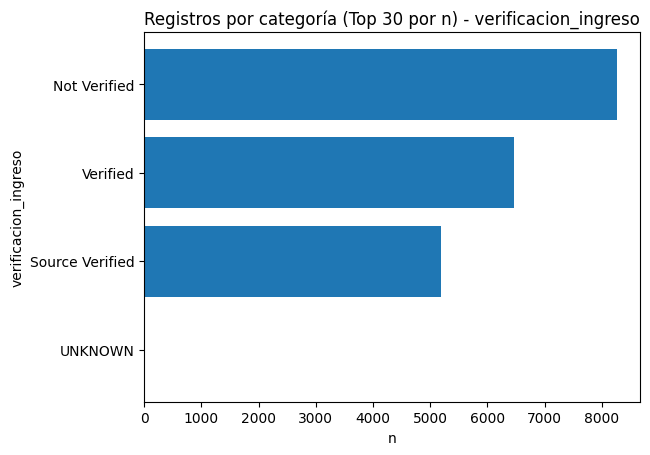


CATEGÓRICA: plan_pagos | Target positivo = Charged Off
                n  tasa_evento
plan_pagos                    
s           19905     0.147852


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


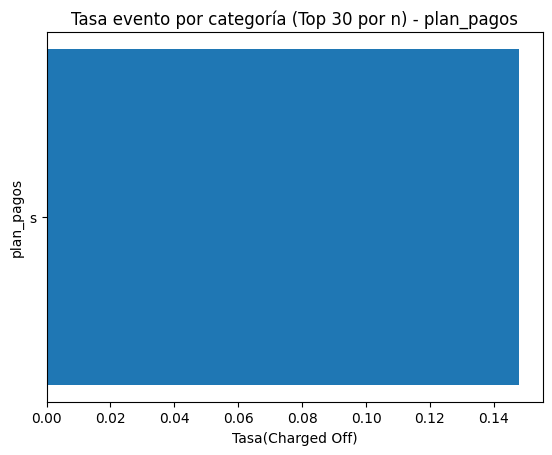

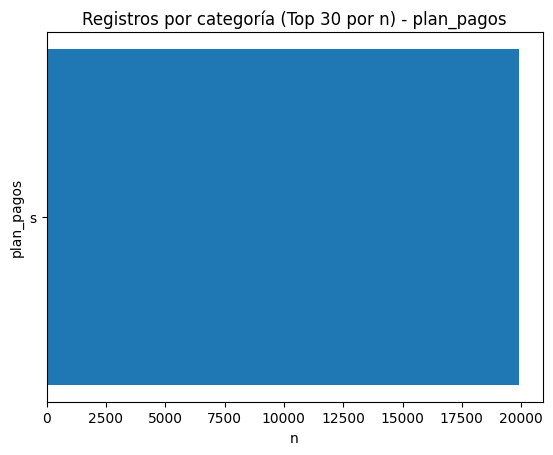


CATEGÓRICA: proposito_prestamo | Target positivo = Charged Off
                       n  tasa_evento
proposito_prestamo                   
debt_consolidation  9387     0.154362
credit_card         2696     0.114243
OTHER               2059     0.156387
home_improvement    1330     0.124812
major_purchase      1048     0.112595
small_business       905     0.271823
car                  687     0.107715
wedding              539     0.105751
medical              350     0.145714
moving               317     0.170347
vacation             199     0.140704
house                176     0.176136
educational          161     0.198758
renewable_energy      51     0.137255
UNKNOWN                0          NaN


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


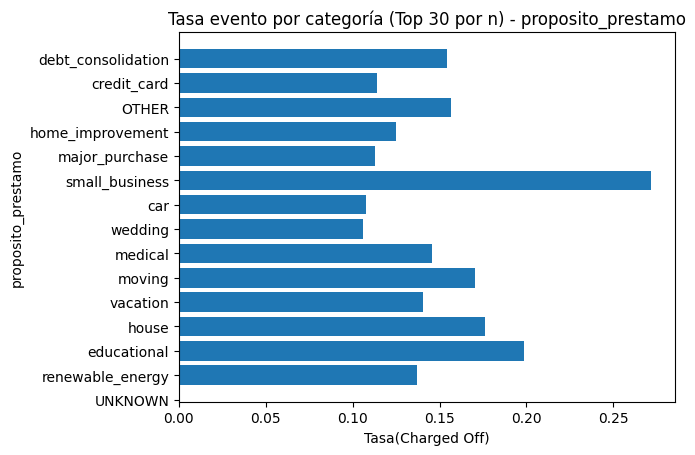

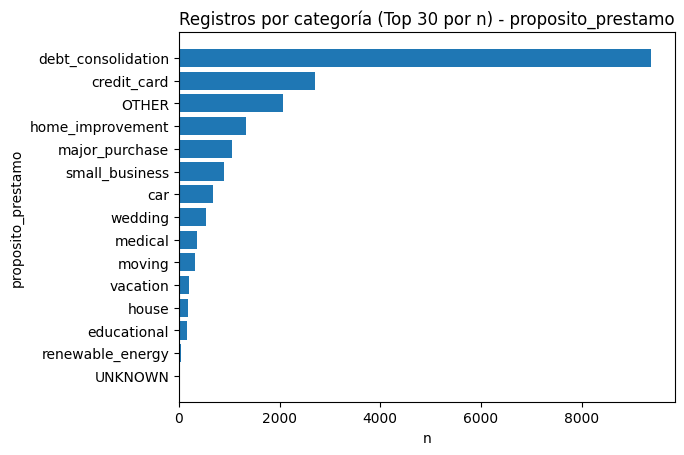


CATEGÓRICA: estado_residencia | Target positivo = Charged Off
                      n  tasa_evento
estado_residencia                   
CA                 7101     0.159273
NY                 3813     0.131393
FL                 2870     0.177352
TX                 2733     0.117819
NJ                 1855     0.152022
IL                 1525     0.129836
UNKNOWN               8     0.000000


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


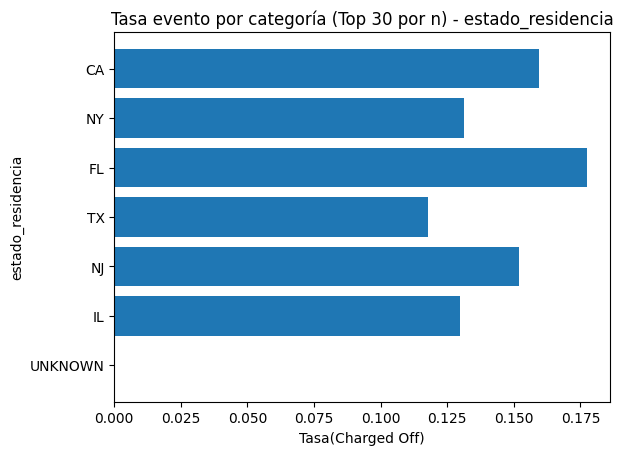

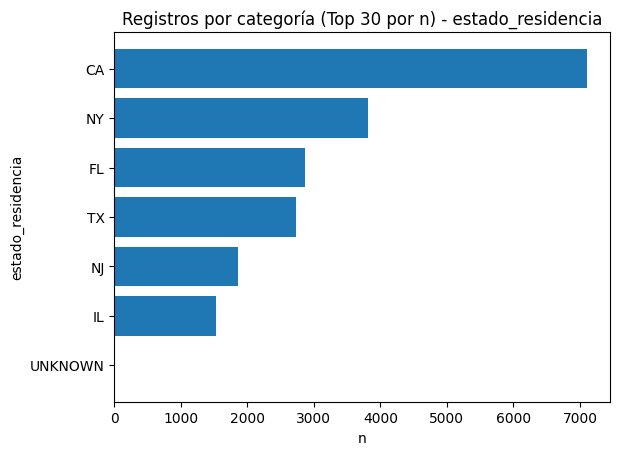


CATEGÓRICA: tipo_solicitud | Target positivo = Charged Off
                    n  tasa_evento
tipo_solicitud                    
Individual      19905     0.147852


/tmp/ipython-input-2049600965.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)
/tmp/ipython-input-2049600965.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


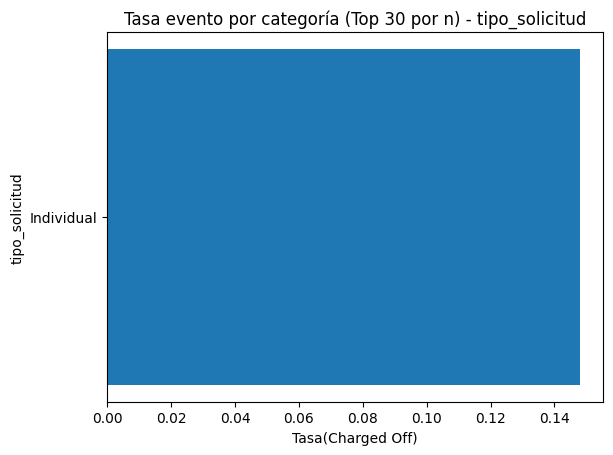

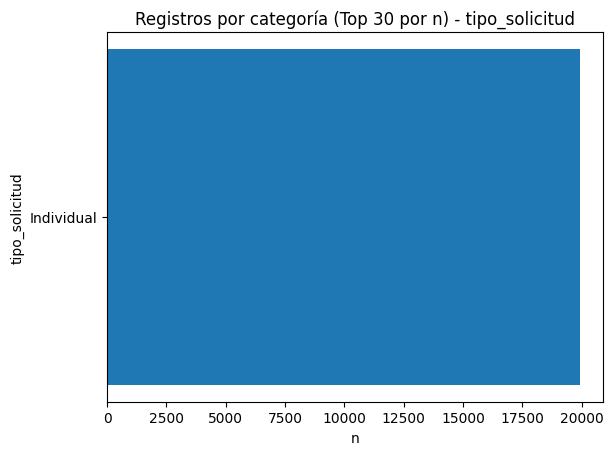

In [ ]:
TARGET = "estado_prestamo"
POSITIVE = "Charged Off"


valid_y = Data_2[TARGET].isin(["Fully Paid", "Charged Off"])



def cat_vs_target(col, top=30):

    mask = valid_y & Data_2[col].notna()
    if mask.sum() == 0:
        print(f"\n{col}: sin datos válidos (NaN o target inválido).")
        return

    y_bin = (Data_2.loc[mask, TARGET] == POSITIVE).astype(int)


    n = Data_2.loc[mask].groupby(col).size().sort_values(ascending=False)


    tasa = y_bin.groupby(Data_2.loc[mask, col]).mean()


    tabla = pd.DataFrame({
        "n": n,
        "tasa_evento": tasa.reindex(n.index)
    })

    print("\n" + "="*90)
    print(f"CATEGÓRICA: {col} | Target positivo = {POSITIVE}")
    print("="*90)
    print(tabla)


    tabla_top = tabla.head(top)

    plt.figure()
    plt.barh(tabla_top.index.astype("string"), tabla_top["tasa_evento"].values)
    plt.title(f"Tasa evento por categoría (Top {top} por n) - {col}")
    plt.xlabel(f"Tasa({POSITIVE})")
    plt.ylabel(col)
    plt.gca().invert_yaxis()
    plt.show()

    plt.figure()
    plt.barh(tabla_top.index.astype("string"), tabla_top["n"].values)
    plt.title(f"Registros por categoría (Top {top} por n) - {col}")
    plt.xlabel("n")
    plt.ylabel(col)
    plt.gca().invert_yaxis()
    plt.show()


for c in cols_cat:
    if c == TARGET:
        continue
    cat_vs_target(c, top=30)
